# Grado en Robótica - Visión Artificial
## Práctica 3: Filtrado frecuencial multirresolución
### Autor: Adrián Losada Álvarez

# Tarefa 1: Actividades cos filtros log-Gabor

### Importamos las librerías necesarias

In [1]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2

/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/adrian/.virtualenvs/VAA/lib/python3.8/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


## Implementamos la clase "BkofLoGabor"
### Junto con los siguientes métodos:
- lowpassfilter(self, cutoff, n) -> Crea un filtro paso-bajo dado una frecuencia de corte (cutoff) y un orden del filtro (n), cuanto más alto es n más abrupta es la transición

- loggabor(self) -> Crea el banco de filtros LogGabor con los parámetros de la clase

b)
- plot_cobertura_espacial(self) -> Visualiza la cobertura espectral de los filtros (roseta)

- plot_cobertura_corte(self) -> Visualiza la cobertura espectral de los filtros con el corte al 0.67%

- plot_forma_espectral(self) -> Visualiza la forma espacial de los filtros por orientación y escala

- plot_result_convoluciones_par_impar(self) -> Visualiza el resultado de las convoluciones de los filtros con la imagen dada separando parte par e impar para cada orientación y escala

d)
- plot_energia_local_total(self) -> Visualiza la energía local total de la imagen dada

- plot_energia_local_parcial(self) -> Visualiza la energía local por orientación y escala

- plot_fase_local_total(self) -> Visualiza la fase local total de la imagen dada

- plot_fase_local_parcial(self) -> Visualiza la fase local por orientación y escala

d) 
- plot_imagen_reconstruida(self) -> Reconstruye la imagen inicial a partir de las respuestas de los filtros

e) Se puede observar una mejora bastante significativa en la eliminación del ruido en el código aportado.

f)
- plot_simetria_radial(self) -> Visualiza la medida de simetría radial en las imágenes aportadas de piezas industriales

In [2]:
class BkofLoGabor:
    def __init__(self, img, nscale=3, norient=4, minWaveLength=8, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=2.2):
        self.img = img
        self.nscale = nscale
        self.norient = norient
        self.minWaveLength = minWaveLength
        self.mult = mult
        self.sigmaOnf = sigmaOnf
        self.dThetaOnSigma = dThetaOnSigma

        # Filas y columnas
        if len(self.img.shape) == 1:
            self.rows = self.cols = self.img.shape
        else:
            self.rows, self.cols = self.img.shape

        #Comprobamos a paridade de filas e columnas para construir a grella
        # para determinar a parte radial de cada punto no espazo frecuencial
        #Normalizado entre [0,1]
        if (self.cols % 2): # Si cols impares
            self.xvals = np.arange(-(self.cols - 1) / 2., ((self.cols - 1) / 2.) + 1) / float(self.cols - 1)
        else:
            self.xvals = np.arange(-self.cols / 2., self.cols / 2.) / float(self.cols)

        if (self.rows % 2): # Si rows impares
            self.yvals = np.arange(-(self.rows - 1) / 2., ((self.rows - 1) / 2.) + 1) / float(self.rows - 1)
        else:
            self.yvals = np.arange(-self.rows / 2., self.rows / 2.) / float(self.rows)

        #Cambiamos tipo da matriz da imaxe
        if self.img.dtype not in ['float32', 'float64']:
            self.img = np.float64(self.img)
            self.imgdtype = 'float64'
        else:
            self.imgdtype = self.img.dtype

        if self.img.ndim == 3:   #se e de cor promedio as bandas
            self.img = self.img.mean(2)

        self.logGabor = []
        self.spread = 0
        self.roseta = 0
        self.roseta_corte = 0
        self.bk = []
        self.convoluciones = []

        # Llamammos al método para obtener los filtros logGabor
        self.loggabor()

    # Método para crear un filtro paso-bajo
    def lowpassfilter(self, cutoff, n):
        """
        Construimos un filtro paso-baixa de Butterworth con función de transferencia:

            f = 1 / (1 + (w/cutoff)^2n)

        usa:  f = lowpassfilter(cutoff, n)

        onde:   cutoff  é a frecuencia de corte do filtro entre 0 - 0.5
                n   é o orde do filtro, canto mais alto é n mais abruta é a transicion
                (n debe ser enteiro par maior que >= 1).

        OLLO: o orixe do filtro devolto esta na esquina superior.
        """

        if cutoff < 0. or cutoff > 0.5:
            raise Exception('cutoff debe estar 0 e 0.5')
        elif n % 1:
            raise Exception('n debe par e >= 1')

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)
        radius = np.sqrt(x * x + y * y)

        return ifftshift(1. / (1. + (radius / cutoff) ** (2. * n)))

    # Método para crear banco de filtros LogGabor
    def loggabor(self):
        """
        Funcion para achar un banco de filtros logGabor.
        """

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)

        #coordendas planas: radio e angulo polar (sentido antihorario)
        radius = np.sqrt(x * x + y * y)
        theta = np.arctan2(-y, x)

        # Desprazamento de cuadrantes de  radius e theta para construir 
        # os filtros coa frecuencia 0 nas esquinas (formatos datos de fft2())
        radius = ifftshift(radius)
        theta = ifftshift(theta)

        # Como traballaremos con Gabor logaritmicas non pode
        # haber puntos nulos pola indeterminación da funcion logaritmo.
        # Polo tanto, que o orixe o cambiamos a 1 para que o log(1)=0.
        radius[0, 0] = 1.

        #Achamos os senos e os cosenos en cada punto do especto correpondente
        sintheta = np.sin(theta)
        costheta = np.cos(theta)

        del x, y, theta #Libremos algo de memoria

        # Iniciamos a construcion dun banco de filtros log-Gabor 
        # a diferentes orientacions e escalas 

        # Os filtros son separables en duas compoñentes:
        # 1) A compoñente radial, controla o ancho de bando do filtro e a frecuencia
        #   central a que responderá o filtro
        #    
        # 2) A compoñenete angular, que controla a orientación a que responde o filtro

        # O filtro logGabor se construe multiplicando as dúas compeñentes 
        # e o filtro queda conformado no espazo de Fourier

        # Parte radial do filtro... 
        # Primeiro construimos un filtro paso-baixo tan grande como sexa 
        # posible en función das dimensións da imaxe de entrada (mostras espectrais)
        # e que caia a cero nos bordes espectrais. Este filtro será multiplicado
        # por todos os logGabor para evitar truncamentos bruscos e evitar asi o
        # fenomeno do anillado (ringing) como vimos na teoría

        # filtro paso-baixo e parametros aceptables: radius .45, 'sharpness' 15
        lp = self.lowpassfilter(.45, 15)

        #Lazo para percorrer as escalas fixadas
        for ss in range(self.nscale):
            #longura de onda para cada escala onde mult é 
            #a distancia entre filtros experado en octavas 1 octava = log2(w1/w2)
            wavelength = self.minWaveLength * self.mult ** (ss)

            # Frecuencia central do filtro
            fo = 1. / wavelength

            # Función de transferencia log Gabor
            tmp = np.exp(-(np.log(radius/fo)**2) / (2. * np.log(self.sigmaOnf)**2.))

            # Aplicamos o filtro paso-baixo para evitar o anillado
            tmp = tmp * lp
            # Aseguramonos de que o punto de frecuencia o vale cero!
            tmp[0, 0] = 0.

            self.logGabor.append(tmp) #Gardamos a parte radial do filtro


        # Lazo principal: monta a parte radial e angular de cada
        #filtro en funcion da sua escala e orientacion. Tamen
        # obten a convolucion de cada filtro coa imaxe dando como
        # resultado unha responsta complexa no dominio espacial: na
        # parte real a resposta do filtro par e na imaxinaria a resposta
        # do filtro impar 

        # Achamos a transformda de Fourier da imaxe de entrada
        IM = fft2(self.img)

        # Para cada orientacion...
        for oo in range(self.norient):

            # Construimos a parte angular do filtro logGabor
            angl = oo * (np.pi / self.norient)

            # Calculamos a distancia angular para cada punto da matriz do filtro
            # desde a orientación do filtro especificada. Para superar discontinuidade
            # na distancia angular (360-->0) empregamos o truco trigonometrico 
            # que consiste en tomas as diferencais angulares en seno e en coseno e logo achar
            # a distancia angulos mediante o arcotanxente arctg2(seno/cos). Deste xeito,
            #o seno e o coseno absorben as discontinuidades angulas!

            # diferencias en seno e coseno
            ds = sintheta * np.cos(angl) - costheta * np.sin(angl)
            dc = costheta * np.cos(angl) + sintheta * np.sin(angl)

            # diferencia angular absoluta
            dtheta = np.abs(np.arctan2(ds, dc))
            # parte angular do filtro
            self.spread = np.exp(-(dtheta**2) / (2. * (np.pi / self.norient / self.dThetaOnSigma)**2))

            # Para cada escala ...
            for ss in range(self.nscale):

                # Multiplicamos as compoñentes radial e angular 
                # para construir o filtro logGabor 2D
                filt = self.logGabor[ss] * self.spread

                # Creamos la roseta
                self.roseta += fftshift(filt)

                # Creamos la roseta pero con el corte que se produce
                # a 0.67% del valor máximo de las funciones de
                # transferencia de los filtros en el dominio espectral
                self.roseta_corte += cv2.inRange(fftshift(filt), 0.65, 0.69)

                # Creamos el banco de filtros
                self.bk.append(fftshift(filt))

                # Convolucionamos a imaxe cos filtros par e impar
                # e voltamos ao dominio espacial. Na parte real de
                # thisEO temos a resposta do filtro par da logGabor
                # e na parte imaxinaria a parte impar da logGabor.
                thisEO = ifft2(IM * filt)

                # Resultados de las convoluciones
                self.convoluciones.append(thisEO)

    # Métodos para visualización
    # b)
    def plot_cobertura_espectral(self):
        plt.figure(figsize=[10,10])
        plt.imshow(self.roseta, cmap='gray')
        plt.title('Cobertura espectral (Roseta)')

    def plot_cobertura_corte(self):
        plt.figure(figsize=[10,10])
        plt.imshow(self.roseta_corte, cmap='gray')
        plt.title('Cobertura corte (Roseta 0.67%)')

    def plot_forma_espacial(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                plt.subplot(self.norient, self.nscale, i+1)
                plt.title('oo={} ss={}'.format(oo, ss))
                plt.imshow(np.real(self.bk[i]), cmap='gray')

                i += 1

    def plot_result_convoluciones_par_impar(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                # Parte real
                if(i==0): plt.subplot(self.norient, self.nscale*2, 1)
                else: plt.subplot(self.norient, self.nscale*2, i*2+1)
                plt.title('Real(oo={} ss={})'.format(oo, ss))
                plt.imshow(np.real(self.convoluciones[i]), cmap='gray')

                # Parte imag
                plt.subplot(self.norient, self.nscale*2, (i+1)*2)
                plt.title('Imag(oo={} ss={})'.format(oo, ss))
                plt.imshow(np.imag(self.convoluciones[i]), cmap='gray')

                i += 1

    # c)
    # Energía
    def plot_energia_local_total(self):
        # Calculamos la energía (módulo) de cada convolución y las sumamos
        par = 0
        impar = 0
        for conv in self.convoluciones:
            par += np.real(conv)
            impar += np.imag(conv)

        energia = np.sqrt(par**2 + impar**2)

        plt.figure(figsize=[10,10])
        plt.imshow(energia, cmap='gray')
        plt.title('Energía local total')

    def plot_energia_local_parcial(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                energia = np.sqrt(np.real(self.convoluciones[i])**2 + np.imag(self.convoluciones[i])**2)
                plt.subplot(self.norient, self.nscale, i+1)
                plt.title('Energía(oo={} ss={})'.format(oo, ss))
                plt.imshow(energia, cmap='gray')
                i += 1

    # Fase
    def plot_fase_local_total(self):
        # Calculamos la fase (ángulo) de cada convolución y las sumamos
        par = 0
        impar = 0
        for conv in self.convoluciones:
            par += np.real(conv)
            impar += np.imag(conv)
        fase = np.arctan(impar/par)

        plt.figure(figsize=[10,10])
        plt.imshow(fase, cmap='gray')
        plt.title('Fase local total')

    def plot_fase_local_parcial(self):
        plt.figure(figsize=[10,10])
        i = 0
        for oo in range(self.norient):
            for ss in range(self.nscale):
                fase = np.arctan(np.real(self.convoluciones[i])/np.imag(self.convoluciones[i]))
                plt.subplot(self.norient, self.nscale, i+1)
                plt.title('Fase(oo={} ss={})'.format(oo, ss))
                plt.imshow(fase, cmap='gray')
                i += 1

    # d)
    def plot_imagen_reconstruida(self):
        rebuild = 0
        for conv in self.convoluciones:
            rebuild+= np.real(conv)

        plt.figure(figsize=[10,10])
        plt.imshow(rebuild, cmap='gray')
        plt.title('Imagen reconstruida con parte par')

    # f)
    def plot_simetria_radial(self):
        results = []
        for ss in range(self.nscale):
            mult_orient = 1
            for oo in range(self.norient):
                # Multiplicamos las orientaciones
                mult_orient = np.multiply(np.real(self.convoluciones[oo*self.nscale+ss]), mult_orient)

            # Almacenamos los resultados de las multiplicaciones
            results.append(mult_orient)

        # Obtenemos los maximos de cada resultado para obtener la simetría radial
        simetria_r = results[0]
        for r in results:
            simetria_r = np.maximum(r, simetria_r)

        plt.figure(figsize=[10,10])
        plt.imshow(simetria_r, cmap='gray')
        plt.title('Simetría radial')

    def plot_simetria_radial_con_inversion(self):
        results = []
        for ss in range(self.nscale):
            mult_orient = 1
            for oo in range(self.norient):
                # Multiplicamos las orientaciones
                imagen_invertida = 255 - np.real(self.convoluciones[oo*self.nscale+ss])
                mult_orient = np.multiply(np.real(imagen_invertida), mult_orient)

            # Almacenamos los resultados de las multiplicaciones
            results.append(mult_orient)

        # Obtenemos los maximos de cada resultado para obtener la simetría radial
        simetria_r = results[0]
        for r in results:
            simetria_r = np.maximum(r, simetria_r)

        plt.figure(figsize=[10,10])
        plt.imshow(simetria_r, cmap='gray')
        plt.title('Simetría radial')

## Programa ejecutable "main()":
### Nota: En primer lugar mostraremos los resultados para la imagen 'imtest1.jpg' y posteriormente 'imtest2.jpg'

## Resultados para 'imtest1.jpg':

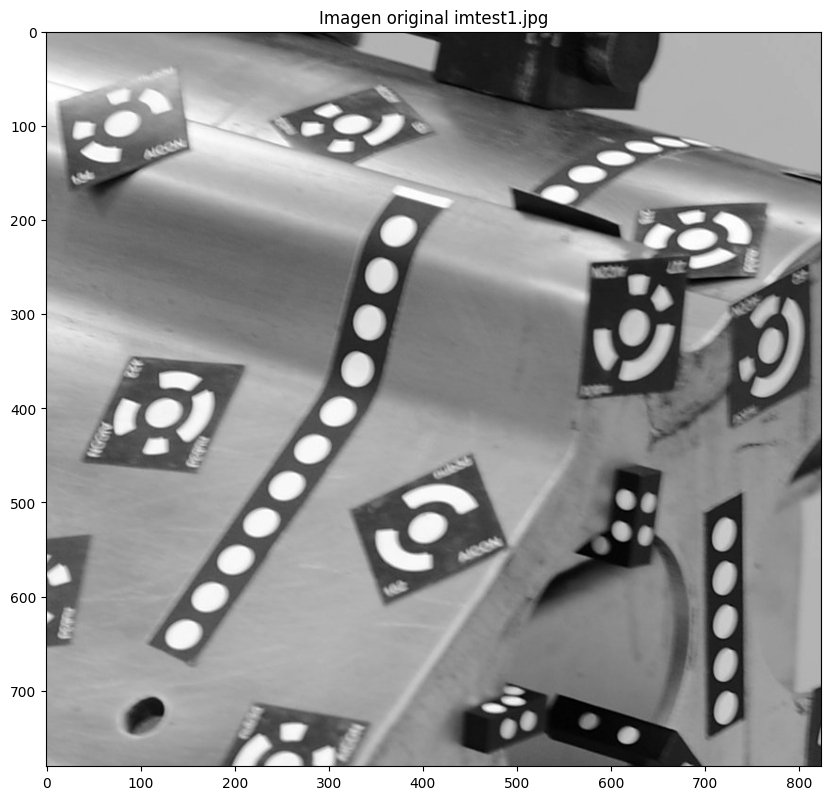

In [3]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest1.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros logGabor (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosLG = BkofLoGabor(imtest, nscale=3, norient=4, minWaveLength=8, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=2.2)

### Visualizaciones:


#### Apartado b)

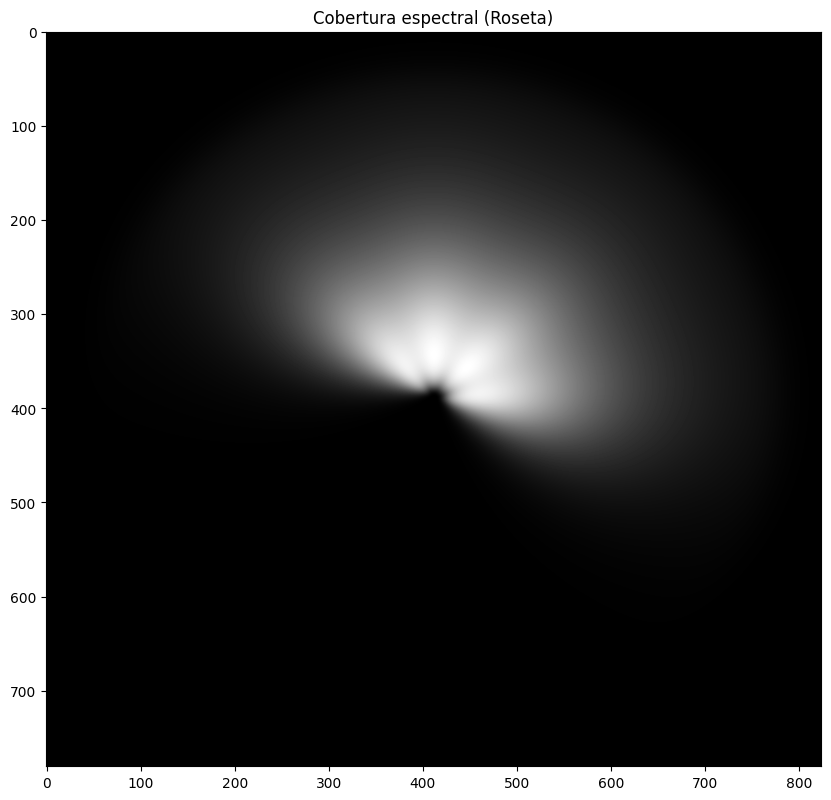

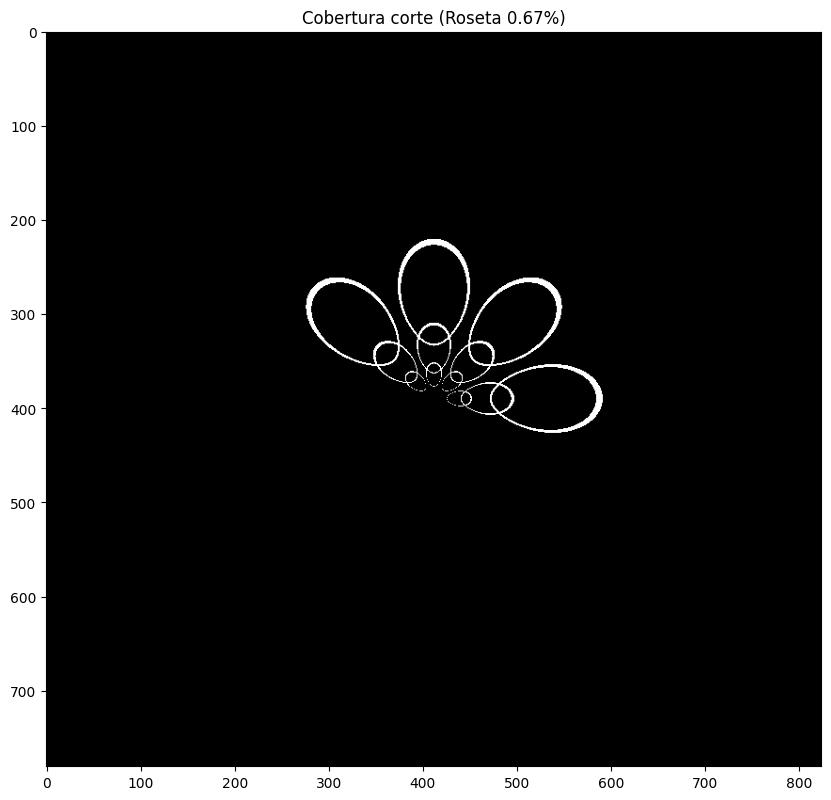

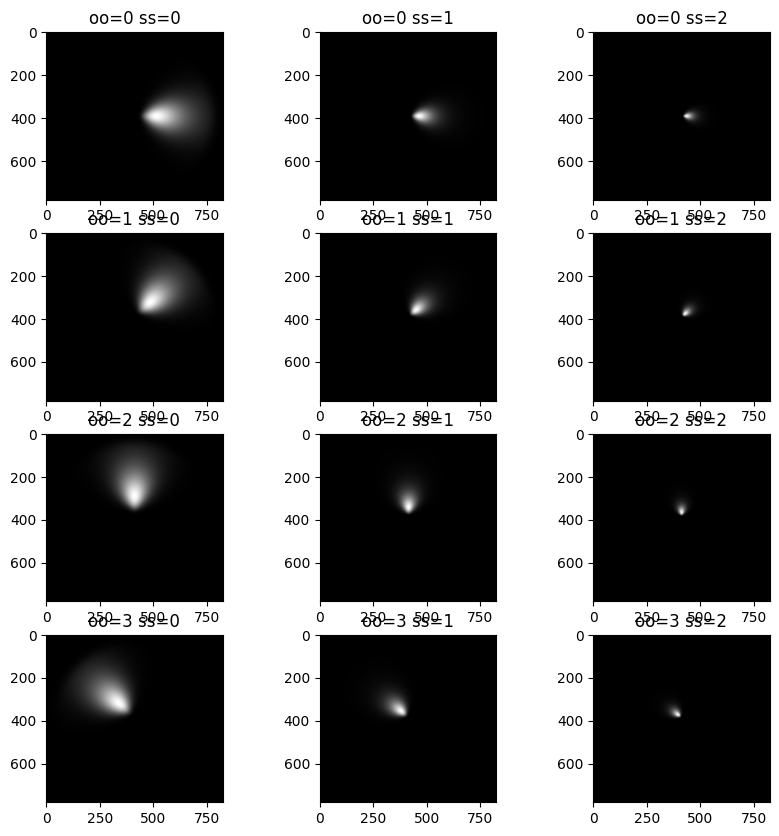

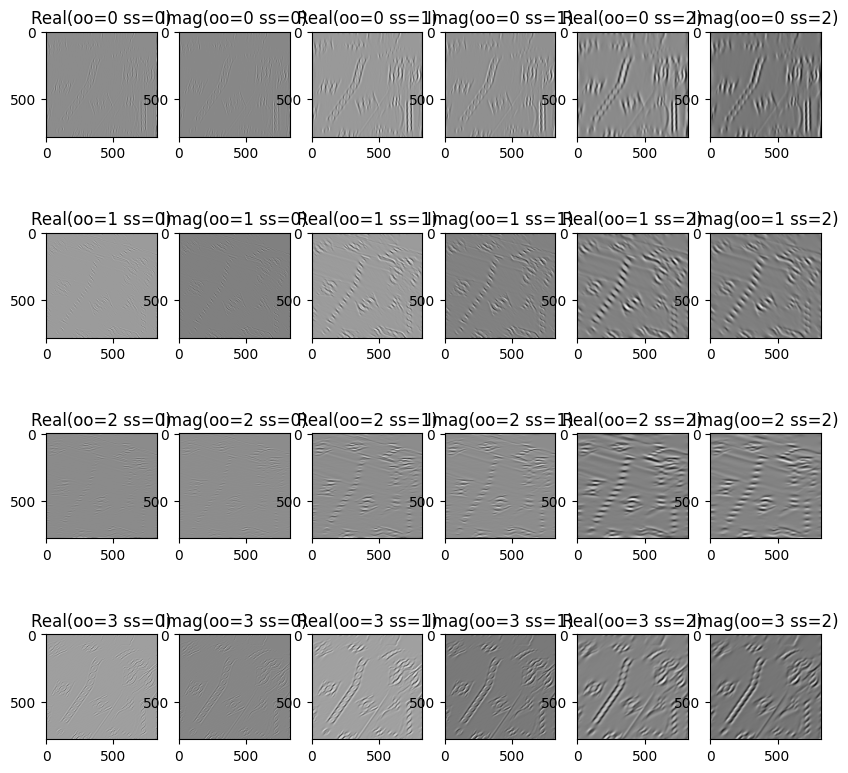

In [4]:
banco_filtrosLG.plot_cobertura_espectral()
banco_filtrosLG.plot_cobertura_corte()
banco_filtrosLG.plot_forma_espacial()
banco_filtrosLG.plot_result_convoluciones_par_impar()

#### Apartado c)

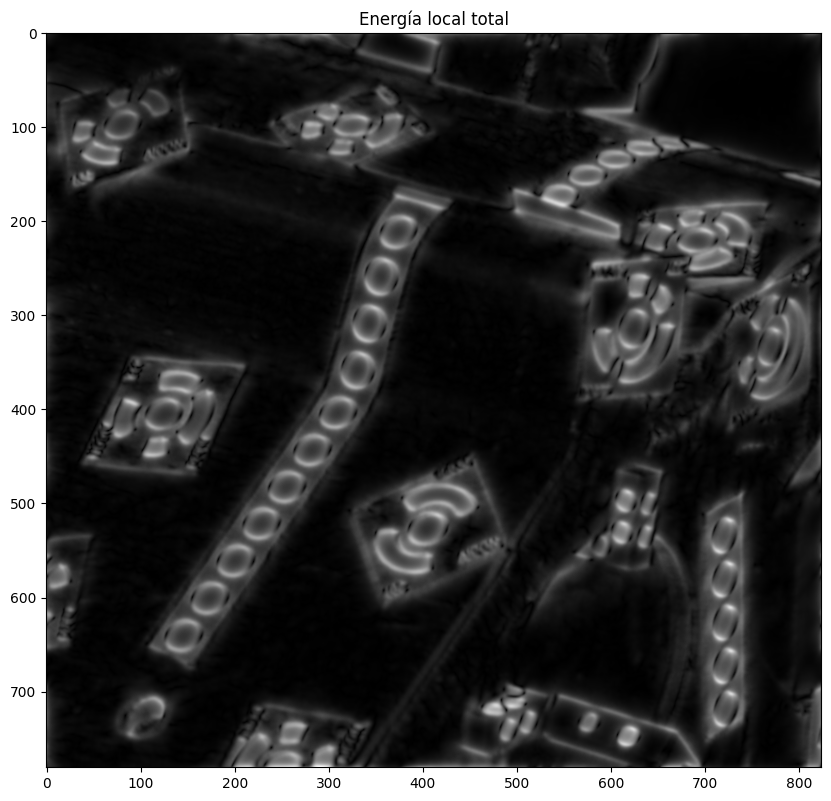

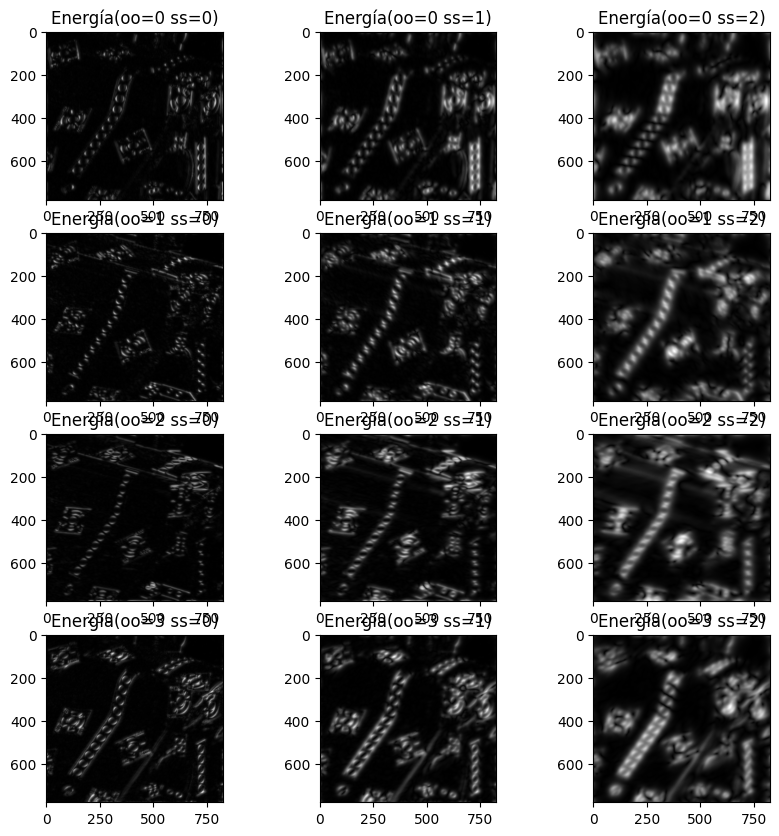

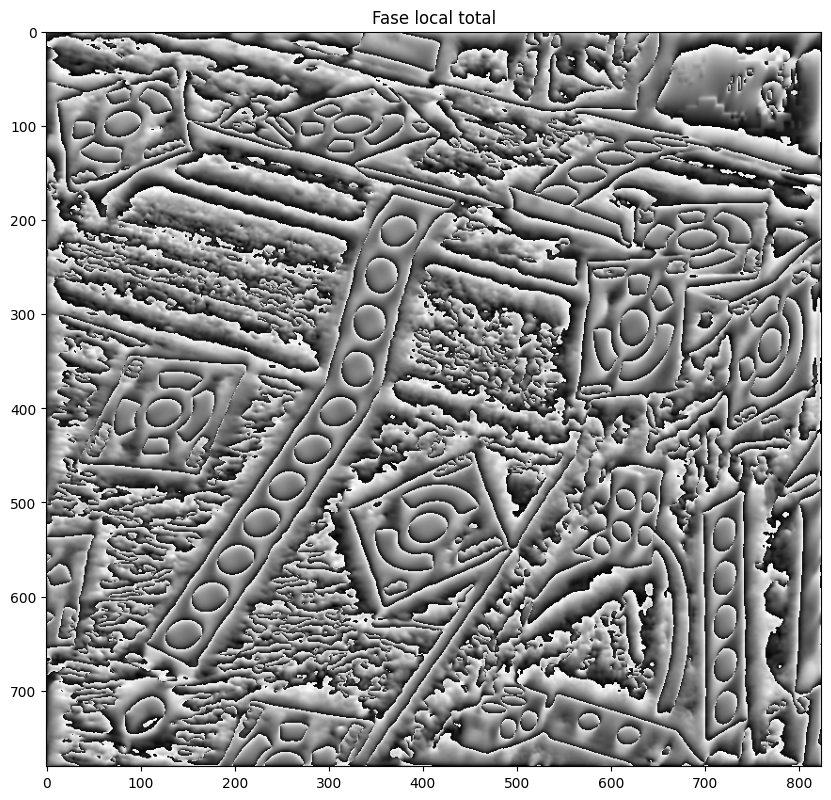

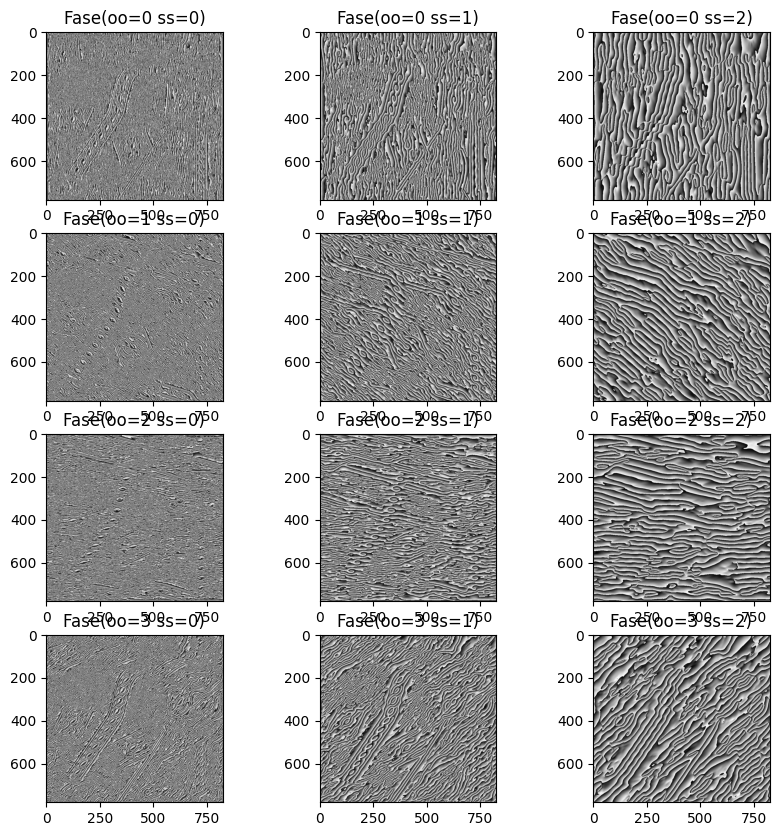

In [5]:
banco_filtrosLG.plot_energia_local_total()
banco_filtrosLG.plot_energia_local_parcial()
banco_filtrosLG.plot_fase_local_total()
banco_filtrosLG.plot_fase_local_parcial()

#### Apartado d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

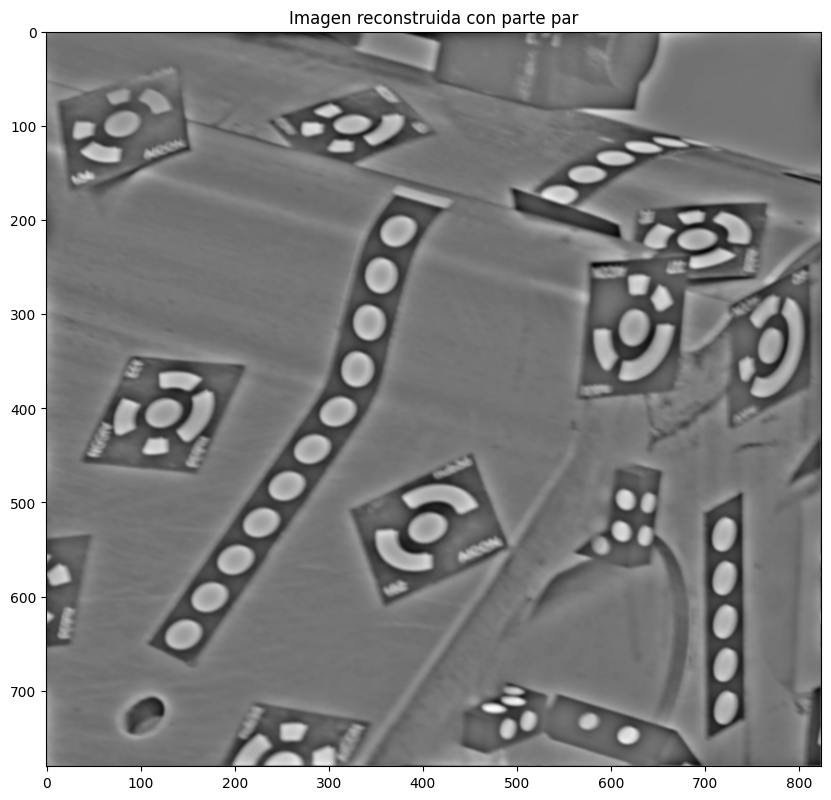

In [6]:
banco_filtrosLG.plot_imagen_reconstruida()

#### Apartado f)
Para este apartado modificaremos los parámetros de los filtros para obtener una mejor respuesta de la simetría radial

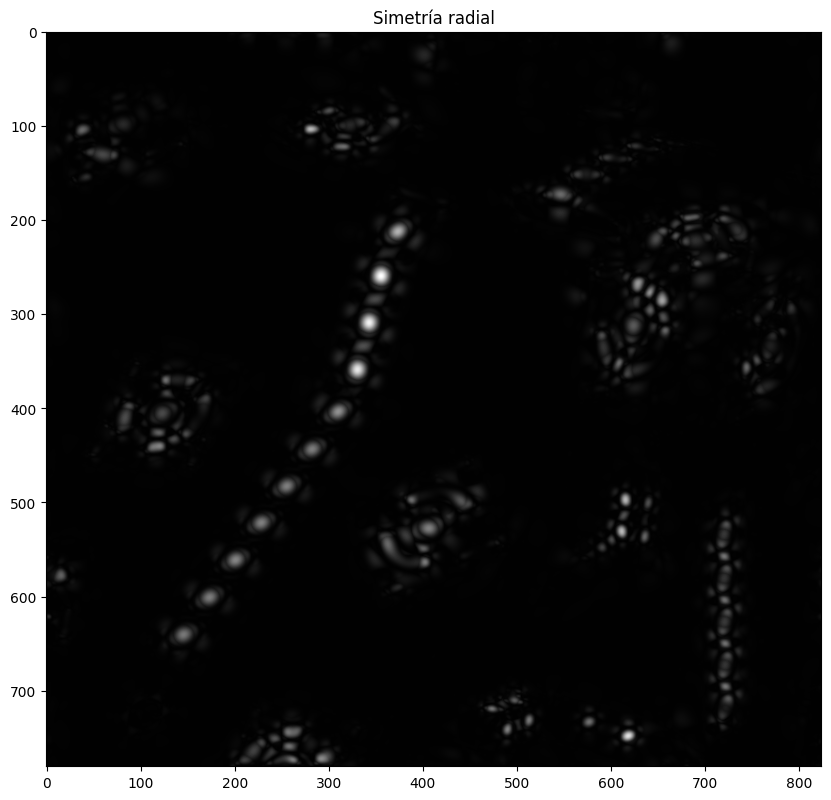

In [7]:
banco_filtrosLG = BkofLoGabor(imtest, nscale=4, norient=3, minWaveLength=6, mult=2.1, sigmaOnf=0.65, dThetaOnSigma=2.1)
banco_filtrosLG.plot_simetria_radial()

## Resultados para 'imtest2.jpg':

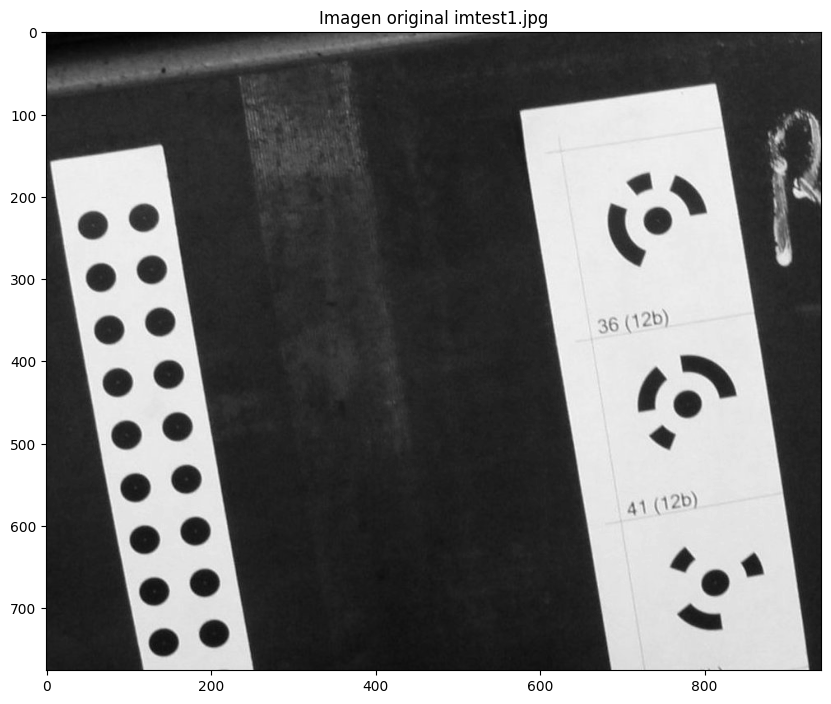

In [8]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest2.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros logGabor (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosLG = BkofLoGabor(imtest, nscale=3, norient=4, minWaveLength=8, mult=2.1, sigmaOnf=0.55, dThetaOnSigma=2.2)

### Visualizaciones:


#### Apartado b)

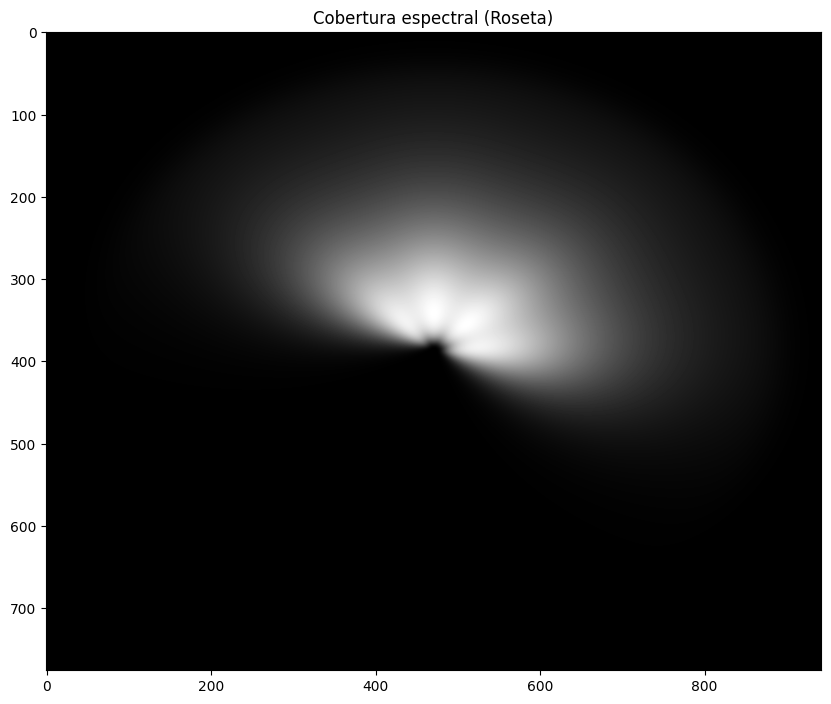

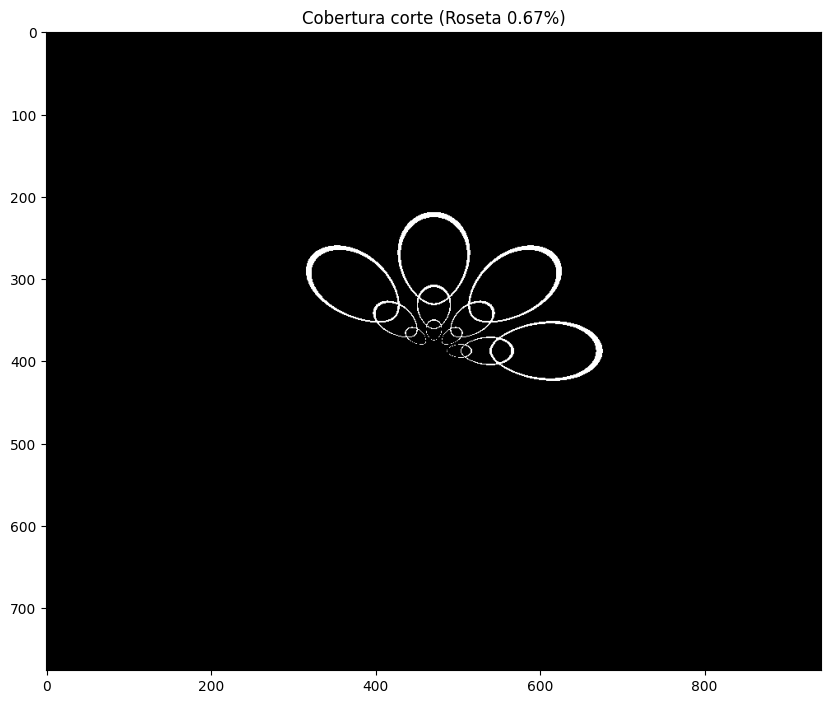

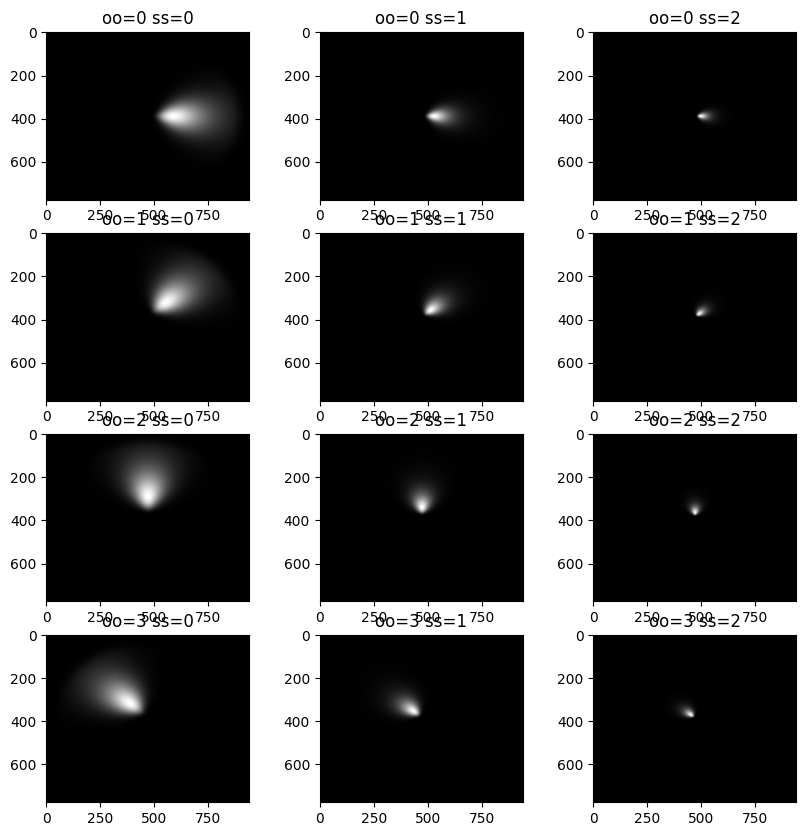

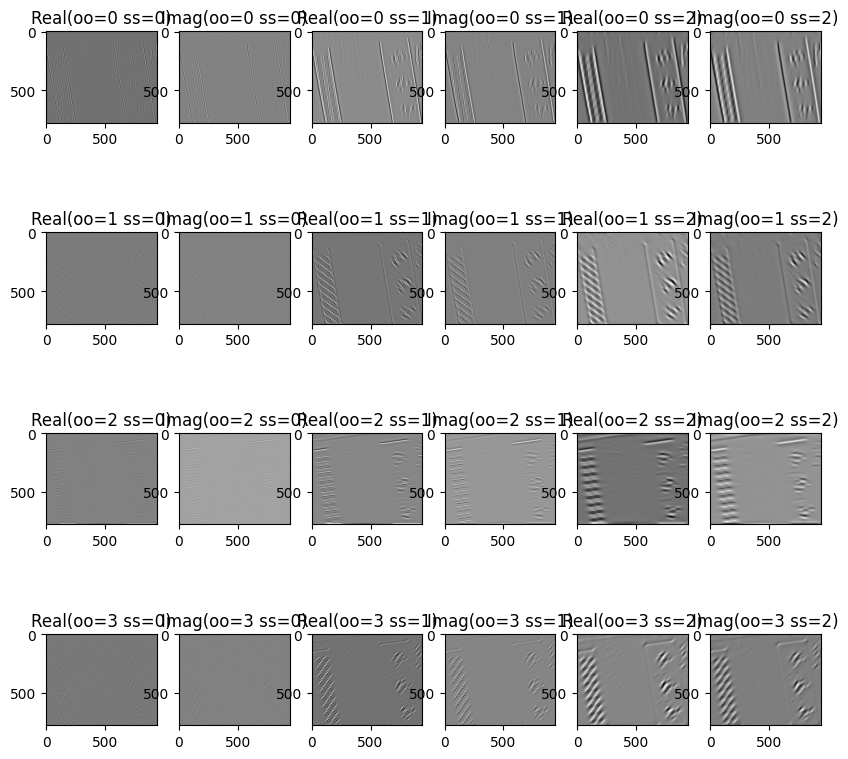

In [9]:
banco_filtrosLG.plot_cobertura_espectral()
banco_filtrosLG.plot_cobertura_corte()
banco_filtrosLG.plot_forma_espacial()
banco_filtrosLG.plot_result_convoluciones_par_impar()

#### Apartado c)

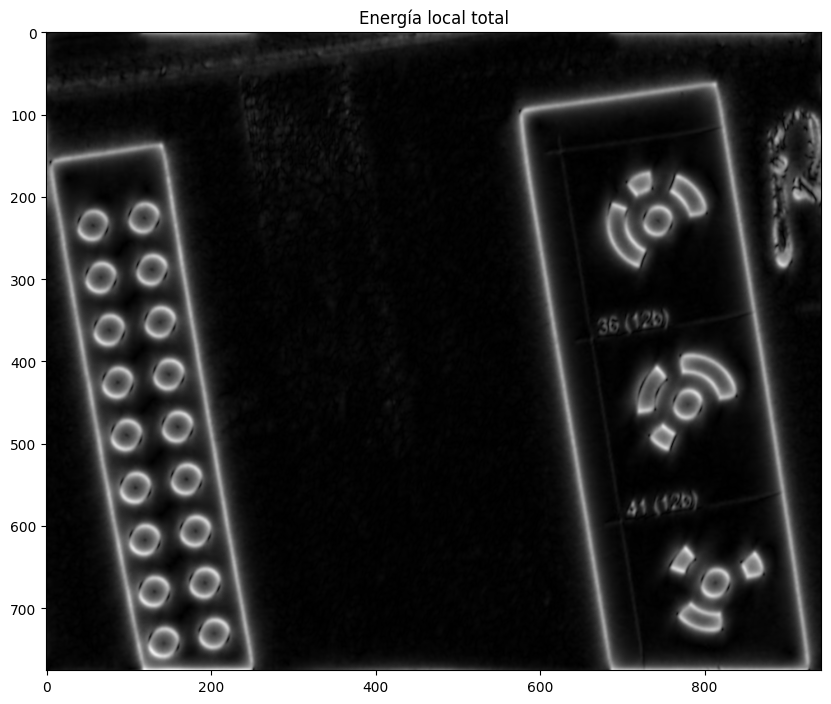

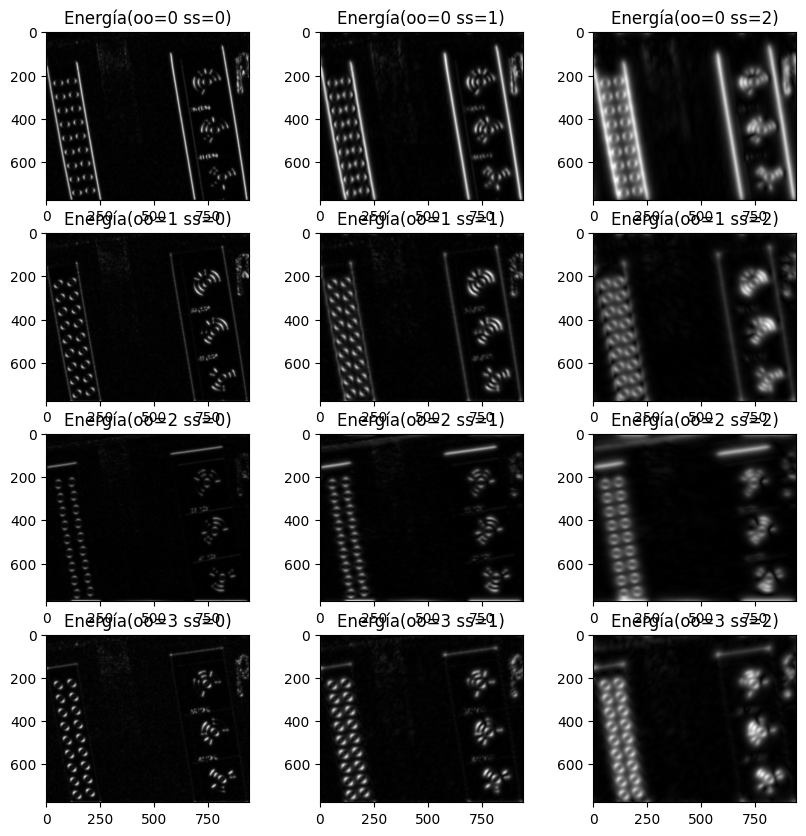

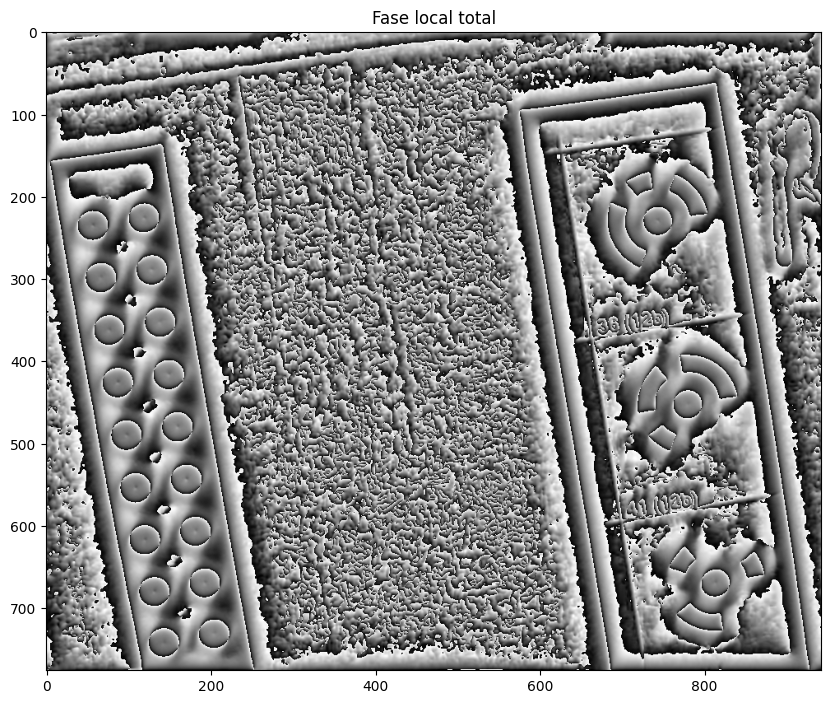

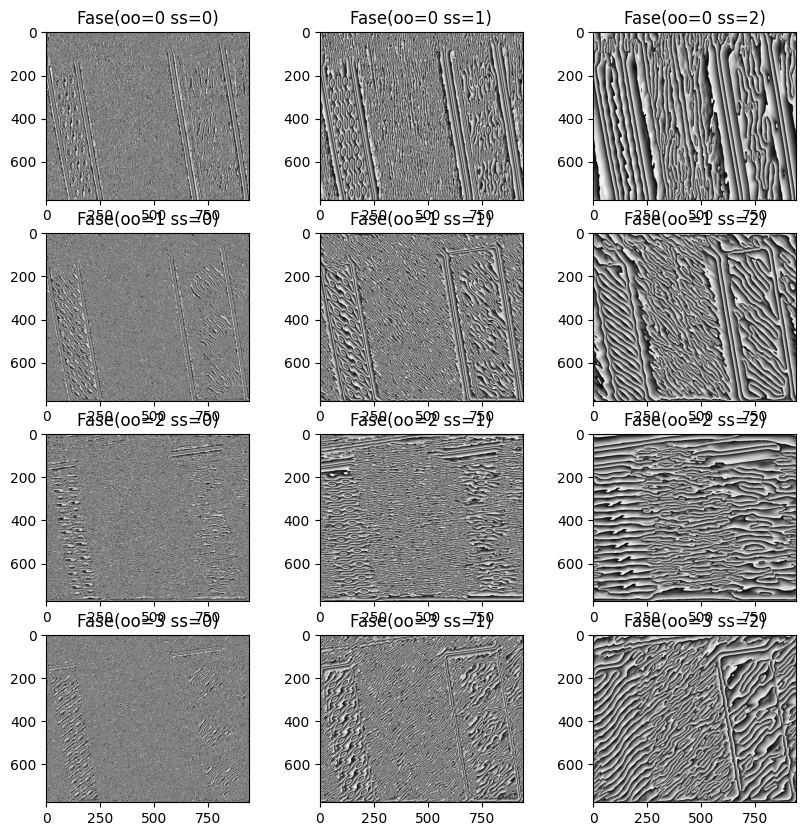

In [10]:
banco_filtrosLG.plot_energia_local_total()
banco_filtrosLG.plot_energia_local_parcial()
banco_filtrosLG.plot_fase_local_total()
banco_filtrosLG.plot_fase_local_parcial()

#### Apartado d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

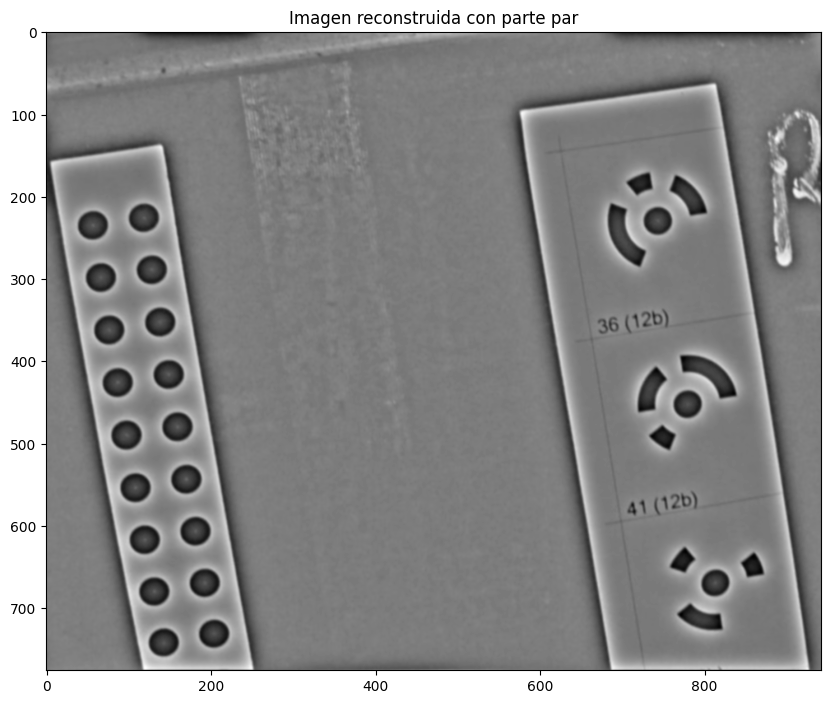

In [11]:
banco_filtrosLG.plot_imagen_reconstruida()

#### Apartado f)
Para este apartado modificaremos los parámetros de los filtros para obtener una mejor respuesta de la simetría radial
Además se invertirán los colores de los resultados de las convoluciones, ya que en la imagen actual las formas fiduciales tienen la parte circular de color negro y cuando realicemos las multiplicaciones para obtener la simetría radial nos interesa quedarnos con los máximos (partes blancas).

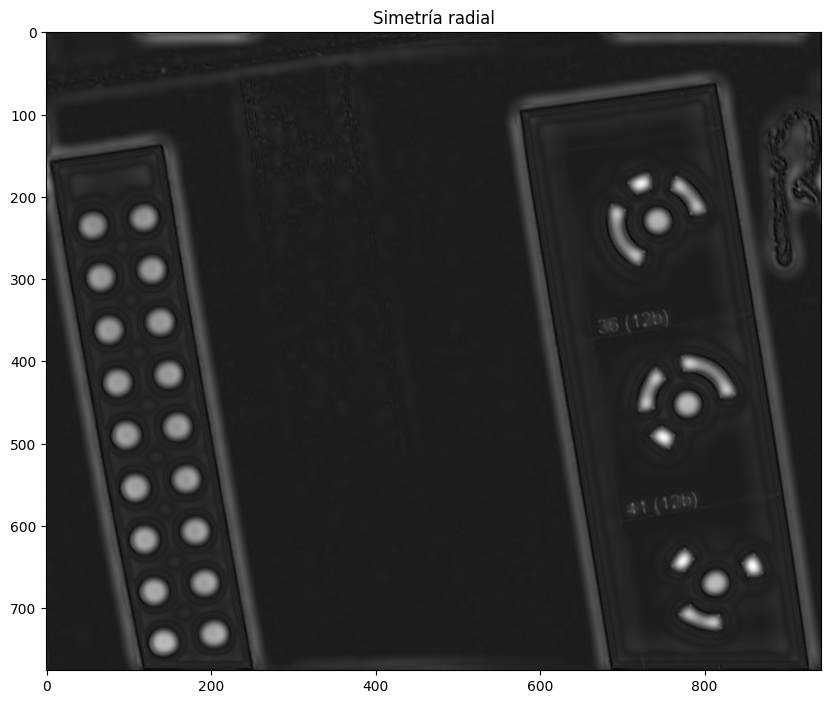

In [12]:
banco_filtrosLG = BkofLoGabor(imtest, nscale=4, norient=4, minWaveLength=4, mult=2.1, sigmaOnf=0.65, dThetaOnSigma=0.5)
banco_filtrosLG.plot_simetria_radial_con_inversion()

# Tarefa 2: Actividades cos filtros monogénicos

## Importamos las librerías necesarias

In [13]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2

## Implementamos la clase "BkofMono"
### Junto con los siguientes métodos:
- lowpassfilter(self, cutoff, n) -> Crea un filtro paso-bajo dado una frecuencia de corte (cutoff) y un orden del filtro (n), cuanto más alto es n más abrupta es la transición

- monogenicos(self) -> Crea el banco de filtros monogénicos con los parámetros de la clase

b)
- plot_cobertura_espectral(self) -> Visualiza la cobertura espectral de los filtros

- plot_forma_espacial(self) -> Visualiza la forma espacial de los filtros: par, impar 1 e impar 2

- plot_resultado_convoluciones2D(self) -> Visualiza el resultado de convolucionar los filtros con la imagen de entrada

d)
- plot_energia_local_total(self) -> Visualiza la energía local total de la imagen dada

- plot_energia_local_parcial(self) -> Visualiza la energía local por orientación y escala

- plot_fase_local_total(self) -> Visualiza la fase local total de la imagen dada

- plot_fase_local_parcial(self) -> Visualiza la fase local por orientación y escala

- plot_orientacion_local_total(self) -> Visualiza la orientación local total de la imagen dada

- plot_orientacion_local_parcial(self) -> Visualiza la orientación local por orientación y escala

d) 
- plot_imagen_reconstruida(self) -> Reconstruye la imagen inicial a partir de las respuestas de los filtros

In [14]:
class BkofMono:
    def __init__(self, img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55):
        self.img = img
        self.nscale = nscale
        self.minWaveLength = minWaveLength
        self.mult = mult
        self.sigmaOnf = sigmaOnf

        # Filas y columnas
        if len(self.img.shape) == 1:
            self.rows = self.cols = self.img.shape
        else:
            self.rows, self.cols = self.img.shape

        #Comprobamos a paridade de filas e columnas para construir a grella
        # para determinar a parte radial de cada punto no espazo frecuencial
        #Normalizado entre [0,1]
        if (self.cols % 2): # Si cols impares
            self.xvals = np.arange(-(self.cols - 1) / 2., ((self.cols - 1) / 2.) + 1) / float(self.cols - 1)
        else:
            self.xvals = np.arange(-self.cols / 2., self.cols / 2.) / float(self.cols)

        if (self.rows % 2): # Si rows impares
            self.yvals = np.arange(-(self.rows - 1) / 2., ((self.rows - 1) / 2.) + 1) / float(self.rows - 1)
        else:
            self.yvals = np.arange(-self.rows / 2., self.rows / 2.) / float(self.rows)

        self.logGabor = []
        self.go1_filt = []
        self.go2_filt = []
        self.filtrosPares = []
        self.filtrosImparesX = []
        self.filtrosImparesY = []

        # Llamammos al método para obtener los filtros monogenicos
        self.monogenicos()

    # Método para construir un filtro paso-bajo
    def lowpassfilter(self, cutoff, n):
        """
        Construimos un filtro paso-baixa de Butterworth con función de transferencia:

            f = 1 / (1 + (w/cutoff)^2n)

        usa:  f = lowpassfilter(cutoff, n)

        onde:   cutoff  é a frecuencia de corte do filtro entre 0 - 0.5
                n   é o orde do filtro, canto mais alto é n mais abruta é a transicion
                (n debe ser enteiro par maior que >= 1).

        OLLO: o orixe do filtro devolto esta na esquina superior.
        """

        if cutoff < 0. or cutoff > 0.5:
            raise Exception('cutoff debe estar 0 e 0.5')
        elif n % 1:
            raise Exception('n debe par e >= 1')

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)
        radius = np.sqrt(x * x + y * y)

        return ifftshift(1. / (1. + (radius / cutoff) ** (2. * n)))

    # Método para crear los filtros monogenicos
    def monogenicos(self):
        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)

        #coordendas planas: radio e angulo polar (sentido antihorario)
        radius = np.sqrt(x * x + y * y)
        theta = np.arctan2(-y, x)

        # Desprazamento de cuadrantes de  radius e theta para construir 
        # os filtros coa frecuencia 0 nas esquinas (formatos datos de fft2())
        radius = ifftshift(radius)
        theta = ifftshift(theta)

        radius[0, 0] = 1.

        matrix_X = 1j*x/radius
        matrix_Y = 1j*y/radius

        lp = self.lowpassfilter(.45, 15)

        # Achamos a transformda de Fourier da imaxe de entrada
        IM = fft2(self.img)

        for ss in range(self.nscale):
            waveLen = self.minWaveLength * self.mult ** ss
            fo = 1. / waveLen

            tmp = np.exp(-((np.log(radius / fo))**2) / (2. * np.log(self.sigmaOnf)**2.))
            tmp = tmp*lp
            tmp[0,0] = 0.

            go1 = tmp*matrix_X
            go2 = tmp*matrix_Y

            # Guardamos la forma espacial de los filtros
            self.logGabor.append(tmp)
            self.go1_filt.append(go1)
            self.go2_filt.append(go2)

            # Convolucionamos la imagen con los filtros
            result_radial = np.real(ifft2(IM*tmp))
            result_go1 = np.real(ifft2(IM*go1))
            result_go2 = np.real(ifft2(IM*go2))

            # Guardamos los resultados
            self.filtrosPares.append(result_radial)
            self.filtrosImparesX.append(result_go1)
            self.filtrosImparesY.append(result_go2)

        # Guardamos la cobertura espectral de los filtros
        self.filtroPar = ifftshift(sum(self.logGabor))
        self.filtroImparX = np.real(ifftshift(ifft2(matrix_X)))
        self.filtroImparY = np.real(ifftshift(ifft2(matrix_Y)))

    # b)
    def plot_cobertura_espectral(self):
        plt.figure()

        plt.subplot(1, 3, 1)
        plt.title('Filtro par')
        plt.imshow(self.filtroPar, cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Filtro impar X')
        plt.imshow(self.filtroImparX, cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title('Filtro impar Y')
        plt.imshow(self.filtroImparY, cmap='gray')

    def plot_forma_espacial(self):
        plt.figure()
        for ss in range(self.nscale):
            plt.subplot(self.nscale, 3, ss*3+1)
            plt.title('Par ss({})'.format(ss))
            plt.imshow(fftshift(np.real(self.logGabor[ss])), cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+2)
            plt.title('Impar X ss({})'.format(ss))
            plt.imshow(fftshift(np.imag(self.go1_filt[ss])), cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+3)
            plt.title('Impar Y ss({})'.format(ss))
            plt.imshow(fftshift(np.imag(self.go2_filt[ss])), cmap='gray')

    def plot_resultado_convoluciones2D(self):
        plt.figure()
        for ss in range(self.nscale):
            plt.subplot(self.nscale, 3, ss*3+1)
            plt.title('Gabor ss({})'.format(ss))
            plt.imshow(self.filtrosPares[ss], cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+2)
            plt.title('goX ss({})'.format(ss))
            plt.imshow(self.filtrosImparesX[ss], cmap='gray')

            plt.subplot(self.nscale, 3, ss*3+3)
            plt.title('goY ss({})'.format(ss))
            plt.imshow(self.filtrosImparesY[ss], cmap='gray')

    # c)
    def plot_energia_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        for ss in range(self.nscale):
            par += self.filtrosPares[ss]
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        amplitud = np.sqrt(par**2 + imparX**2 + imparY**2)
        energia = amplitud**2

        plt.figure()
        plt.imshow(energia, cmap='gray')
        plt.title('Energía local total')

    def plot_energia_local_parcial(self):
        plt.figure()
        for ss in range(self.nscale):
            par = self.filtrosPares[ss]
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            amplitud = np.sqrt(par**2 + imparX**2 + imparY**2)
            energia = amplitud**2

            plt.subplot(1, self.nscale, ss+1)
            plt.title('Energía local (ss={})'.format(ss))
            plt.imshow(energia, cmap='gray')

    def plot_fase_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        for ss in range(self.nscale):
            par += self.filtrosPares[ss]
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        fo = np.sqrt(imparX**2 + imparY**2)
        fase = np.arctan2(par, fo)

        plt.figure()
        plt.imshow(fase, cmap='gray')
        plt.title('Fase local total')

    def plot_fase_local_parcial(self):
        plt.figure()
        for ss in range(self.nscale):
            par = self.filtrosPares[ss]
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            fo = np.sqrt(imparX**2 + imparY**2)
            fase = np.arctan2(par, fo)

            plt.subplot(1, self.nscale, ss+1)
            plt.title('Fase local (ss={})'.format(ss))
            plt.imshow(fase, cmap='gray')

    def plot_orientacion_local_total(self):
        imparX = 0
        imparY = 0  
        for ss in range(self.nscale):
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        orientacion = np.arctan(imparY/imparX)

        plt.figure()
        plt.imshow(orientacion, cmap='gray')
        plt.title('Orientacion local total')

    def plot_orientacion_local_parcial(self):
        plt.figure()
        for ss in range(self.nscale):
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            orientacion = np.arctan(imparY/imparX)

            plt.subplot(1, self.nscale, ss+1)
            plt.title('Orientacion local (ss={})'.format(ss))
            plt.imshow(orientacion, cmap='gray')

    # d)
    def plot_imagen_reconstruida(self):
        rebuild = 0
        for conv in self.filtrosPares:
            rebuild += np.real(conv)

        plt.figure()
        plt.imshow(rebuild, cmap='gray')
        plt.title('Imagen reconstruida con parte par')

## Programa ejecutable "main()":
### Nota: En primer lugar mostraremos los resultados para la imagen 'imtest1.jpg' y posteriormente 'imtest2.jpg'

## Resultados para 'imtest1.jpg':

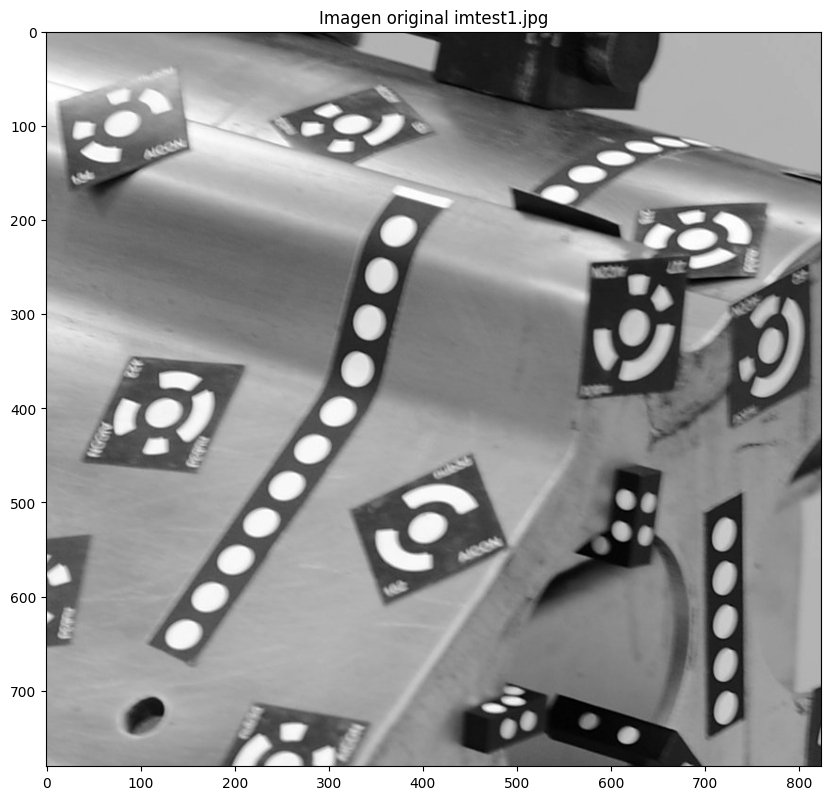

In [15]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest1.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros monoxénicos (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosMONO = BkofMono(imtest, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

### Visualizaciones:

#### Apartado b)

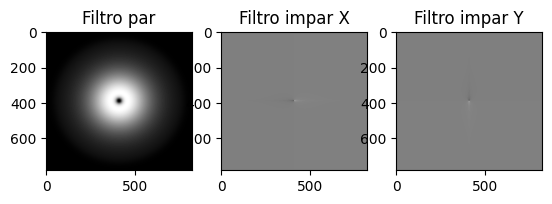

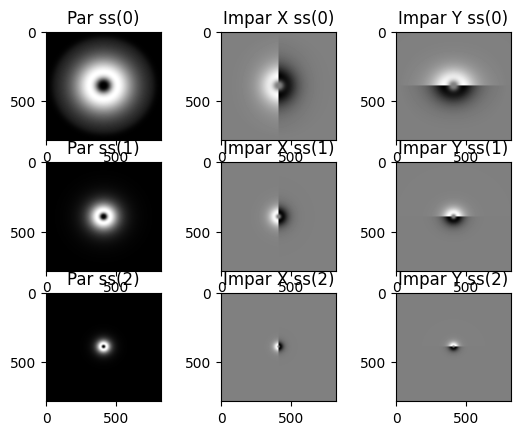

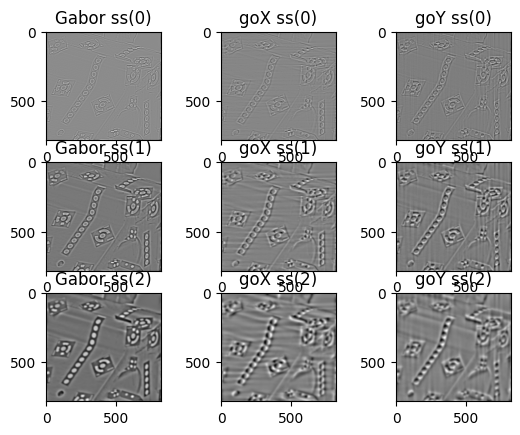

In [16]:
banco_filtrosMONO.plot_cobertura_espectral()
banco_filtrosMONO.plot_forma_espacial()
banco_filtrosMONO.plot_resultado_convoluciones2D()

#### Apartado c)

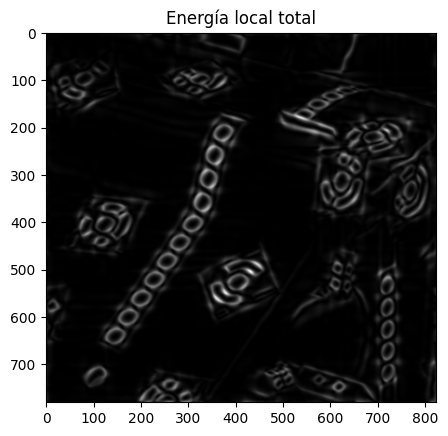

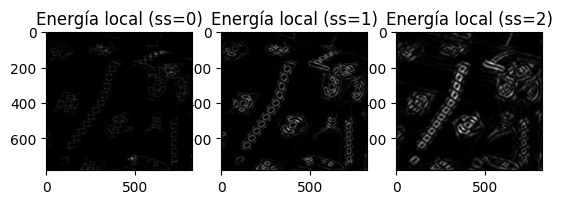

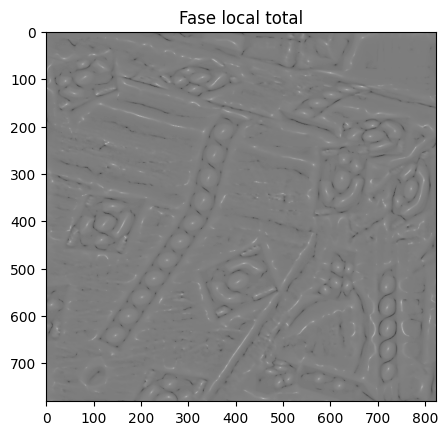

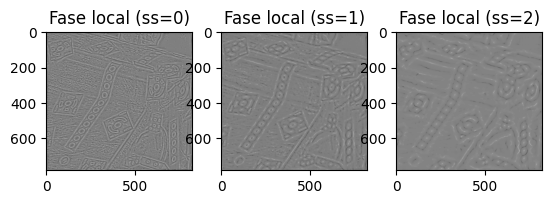

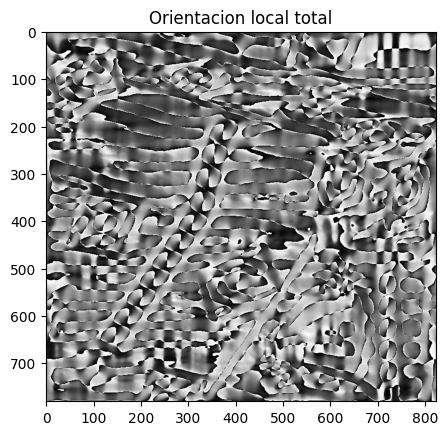

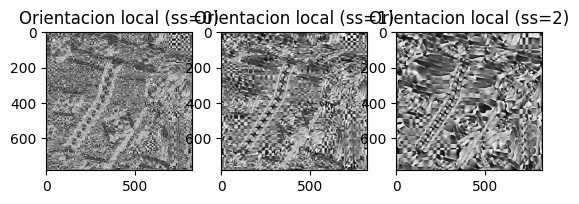

In [17]:
banco_filtrosMONO.plot_energia_local_total()
banco_filtrosMONO.plot_energia_local_parcial()
banco_filtrosMONO.plot_fase_local_total()
banco_filtrosMONO.plot_fase_local_parcial()
banco_filtrosMONO.plot_orientacion_local_total()
banco_filtrosMONO.plot_orientacion_local_parcial()

#### Apartado d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

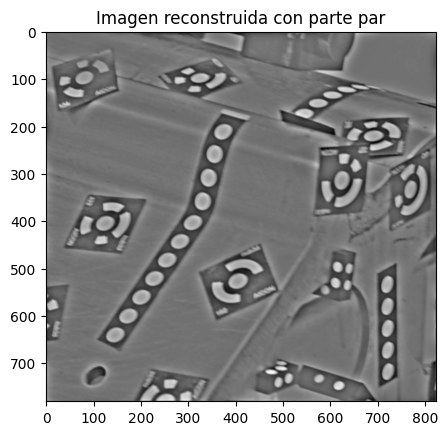

In [18]:
banco_filtrosMONO.plot_imagen_reconstruida()

## Resultados para 'imtest2.jpg':

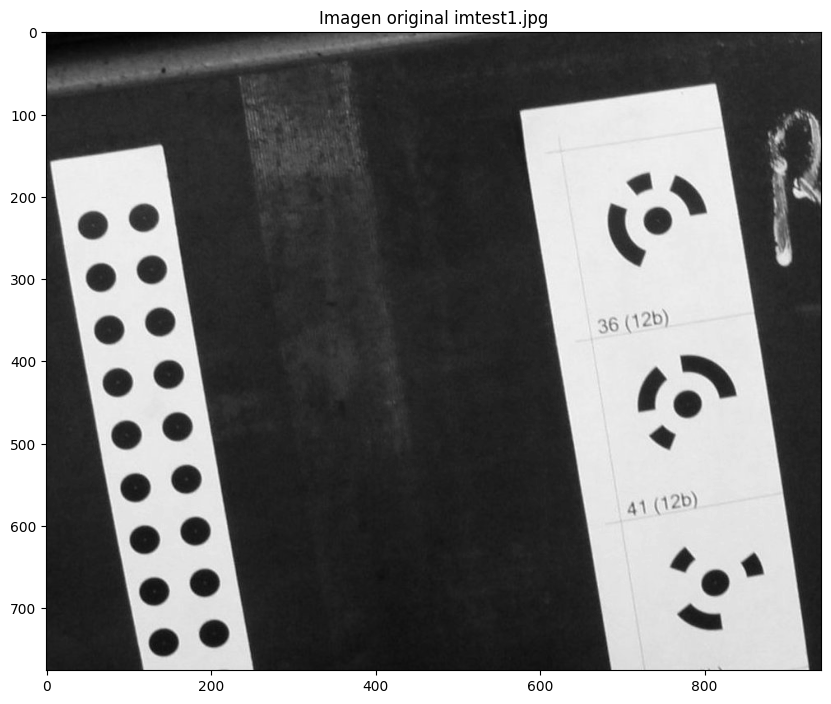

In [19]:
#Lemos a imaxe en formato gris e visualizamos
imtest = cv2.imread('../datatest/simetriaRadial/imtest2.jpg',0)

if imtest is None:
    print('Imaxe non atopada: {}'.format(imtest))
    exit(0)

# Mostramos la imagen inicial
plt.figure(figsize=[10,10])
plt.title('Imagen original imtest1.jpg')
plt.imshow(imtest, cmap='gray')

# Construimos os filtros cos parametros que definen o banco de filtros monoxénicos (cobertura espectral) e
# pasamoslle a imaxe para convolucionar os filtros coa imaxe e obter as respostas pares e impares
banco_filtrosMONO = BkofMono(imtest, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)

### Visualizaciones:

#### Apartado b)

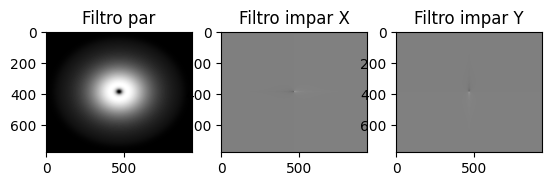

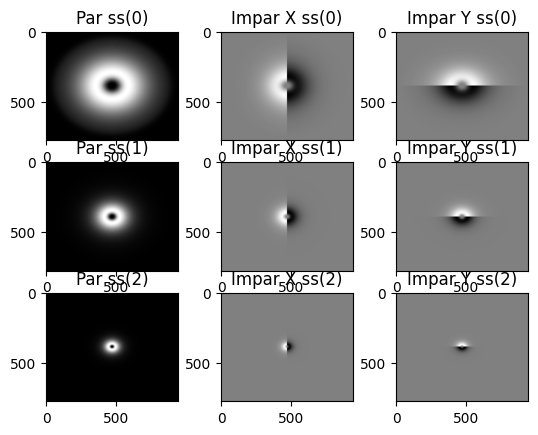

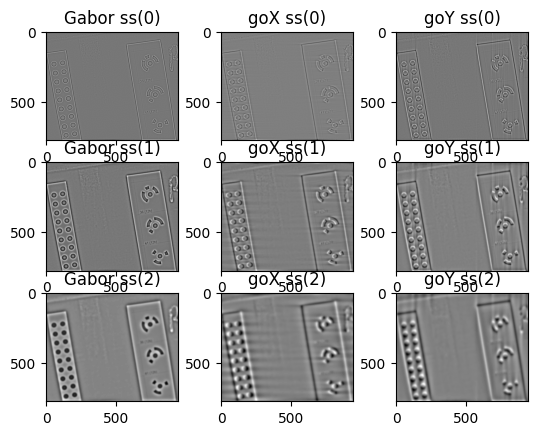

In [20]:
banco_filtrosMONO.plot_cobertura_espectral()
banco_filtrosMONO.plot_forma_espacial()
banco_filtrosMONO.plot_resultado_convoluciones2D()

#### Apartado c)

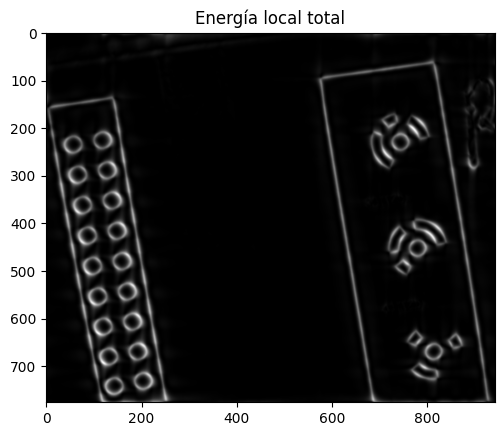

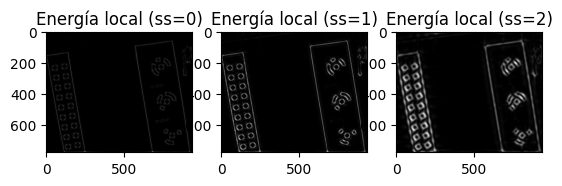

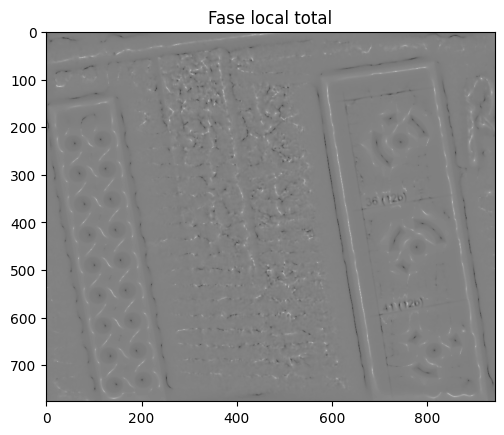

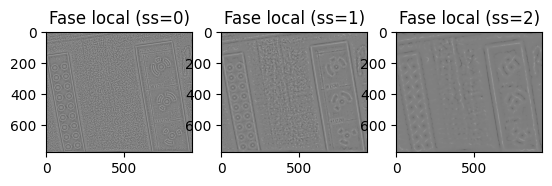

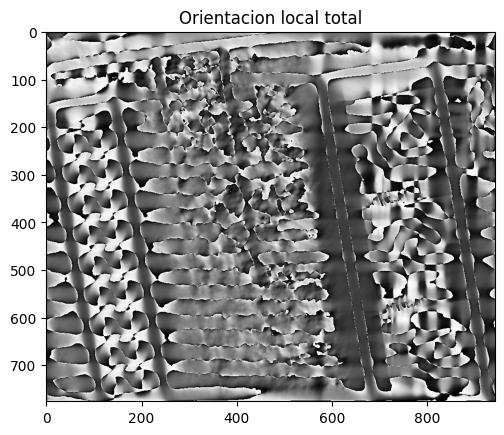

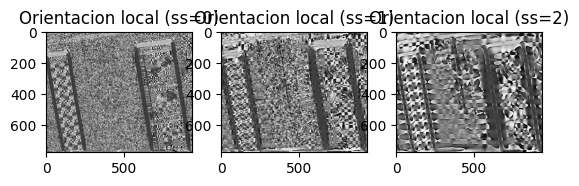

In [21]:
banco_filtrosMONO.plot_energia_local_total()
banco_filtrosMONO.plot_energia_local_parcial()
banco_filtrosMONO.plot_fase_local_total()
banco_filtrosMONO.plot_fase_local_parcial()
banco_filtrosMONO.plot_orientacion_local_total()
banco_filtrosMONO.plot_orientacion_local_parcial()

#### Apartado d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

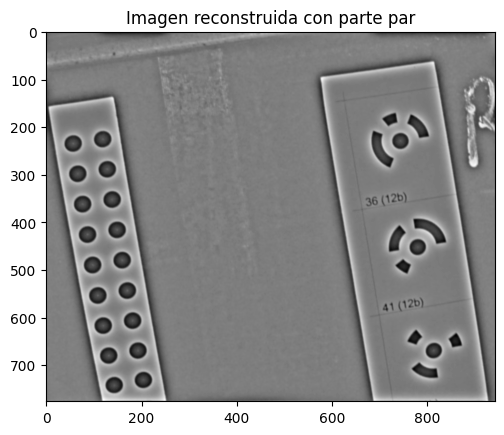

In [22]:
banco_filtrosMONO.plot_imagen_reconstruida()

# Tarefa 2.e): Actividades cos filtros monogénicos 3D

## Importamos las librerías necesarias

In [23]:
#Importamos as librerias precisas
import argparse
import cv2
import numpy as np
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift
from IPython.display import display, Image

# Intentamos empregar a fft2 do modulo pyfftw se esta dispoñible
try:
    from pyfftw.interfaces.scipy_fftpack import fft2, ifft2
# De outra forma, executarase scipy fftpack(~2-3x mais lenta!)
except ImportError:
    import warnings
    warnings.warn("""Modulo 'pyfftw' (FFTW Python bindings) sen intalar. Executa 'pip install pyfftw' no teu entorno""")
    from scipy.fftpack import fft2, ifft2

## Implementamos la clase "BkofMono3D"
### Junto con los siguientes métodos:
- lowpassfilter(self, cutoff, n) -> Crea un filtro paso-bajo dado una frecuencia de corte (cutoff) y un orden del filtro (n), cuanto más alto es n más abrupta es la transición

- monogenicos3D(self) -> Crea el banco de filtros monogénicos con los parámetros de la clase

b)
- plot_cobertura_espectral(self) -> Visualiza la cobertura espectral de los filtros

- plot_forma_espacial(self) -> Visualiza la forma espacial de los filtros: par, impar 1 e impar 2

- plot_resultado_convoluciones3D(self) -> Visualiza el resultado de convolucionar los filtros con la imagen de entrada

d)
- plot_energia_local_total(self) -> Visualiza la energía local total de la imagen dada

- plot_energia_local_parcial(self) -> Visualiza la energía local por orientación y escala

- plot_fase_local_total(self) -> Visualiza la fase local total de la imagen dada

- plot_fase_local_parcial(self) -> Visualiza la fase local por orientación y escala

- plot_orientacion_local_total(self) -> Visualiza la orientación local total de la imagen dada

- plot_orientacion_local_parcial(self) -> Visualiza la orientación local por orientación y escala

d) 
- plot_imagen_reconstruida(self) -> Reconstruye la imagen inicial a partir de las respuestas de los filtros

### Nota: Todos estos métodos son exactamente iguales que los de la clase "BkofMono" pero modificados para poder visualizarlos en 3D con OpenCV en lugar de matplotlib

In [24]:
class BkofMono3D:
    def __init__(self, img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55):
        self.img = img
        self.nscale = nscale
        self.minWaveLength = minWaveLength
        self.mult = mult
        self.sigmaOnf = sigmaOnf

        # Filas y columnas
        if len(self.img.shape) == 1:
            self.rows = self.cols = self.img.shape
        else:
            self.rows, self.cols = self.img.shape

        #Comprobamos a paridade de filas e columnas para construir a grella
        # para determinar a parte radial de cada punto no espazo frecuencial
        #Normalizado entre [0,1]
        if (self.cols % 2): # Si cols impares
            self.xvals = np.arange(-(self.cols - 1) / 2., ((self.cols - 1) / 2.) + 1) / float(self.cols - 1)
        else:
            self.xvals = np.arange(-self.cols / 2., self.cols / 2.) / float(self.cols)

        if (self.rows % 2): # Si rows impares
            self.yvals = np.arange(-(self.rows - 1) / 2., ((self.rows - 1) / 2.) + 1) / float(self.rows - 1)
        else:
            self.yvals = np.arange(-self.rows / 2., self.rows / 2.) / float(self.rows)

        self.logGabor = []
        self.go1_filt = []
        self.go2_filt = []
        self.filtrosPares = []
        self.filtrosImparesX = []
        self.filtrosImparesY = []

        # Llamammos al método para obtener los filtros monogenicos
        self.monogenicos3D()

    # Método para construir un filtro paso-bajo
    def lowpassfilter(self, cutoff, n):
        """
        Construimos un filtro paso-baixa de Butterworth con función de transferencia:

            f = 1 / (1 + (w/cutoff)^2n)

        usa:  f = lowpassfilter(cutoff, n)

        onde:   cutoff  é a frecuencia de corte do filtro entre 0 - 0.5
                n   é o orde do filtro, canto mais alto é n mais abruta é a transicion
                (n debe ser enteiro par maior que >= 1).

        OLLO: o orixe do filtro devolto esta na esquina superior.
        """

        if cutoff < 0. or cutoff > 0.5:
            raise Exception('cutoff debe estar 0 e 0.5')
        elif n % 1:
            raise Exception('n debe par e >= 1')

        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)
        radius = np.sqrt(x * x + y * y)

        return ifftshift(1. / (1. + (radius / cutoff) ** (2. * n)))

    # Método para crear los filtros monogenicos
    def monogenicos3D(self):
        x, y = np.meshgrid(self.xvals, self.yvals, sparse=True)

        #coordendas planas: radio e angulo polar (sentido antihorario)
        radius = np.sqrt(x * x + y * y)
        theta = np.arctan2(-y, x)

        # Desprazamento de cuadrantes de  radius e theta para construir 
        # os filtros coa frecuencia 0 nas esquinas (formatos datos de fft2())
        radius = ifftshift(radius)
        theta = ifftshift(theta)

        radius[0, 0] = 1.

        matrix_X = 1j*x/radius
        matrix_Y = 1j*y/radius

        lp = self.lowpassfilter(.45, 15)

        # Achamos a transformda de Fourier da imaxe de entrada
        IM = fft2(self.img)

        for ss in range(self.nscale):
            waveLen = self.minWaveLength * self.mult ** ss
            fo = 1. / waveLen

            tmp = np.exp(-((np.log(radius / fo))**2) / (2. * np.log(self.sigmaOnf)**2.))
            tmp = tmp*lp
            tmp[0,0] = 0.

            go1 = tmp*matrix_X
            go2 = tmp*matrix_Y

            # Guardamos la forma espacial de los filtros
            self.logGabor.append(tmp)
            self.go1_filt.append(go1)
            self.go2_filt.append(go2)

            # Convolucionamos la imagen con los filtros
            result_radial = np.real(ifft2(IM*tmp))
            result_go1 = np.real(ifft2(IM*go1))
            result_go2 = np.real(ifft2(IM*go2))

            # Guardamos los resultados
            self.filtrosPares.append(result_radial)
            self.filtrosImparesX.append(result_go1)
            self.filtrosImparesY.append(result_go2)

        # Guardamos la cobertura espectral de los filtros
        self.filtroPar = ifftshift(sum(self.logGabor))
        self.filtroImparX = np.real(ifftshift(ifft2(matrix_X)))
        self.filtroImparY = np.real(ifftshift(ifft2(matrix_Y)))

    # Metodo que transforma la imagen para poder representarla en el notebook
    def normaliza(self, img, mult=255):
        norm = matplotlib.colors.Normalize(vmin=img.min(),vmax=img.max())
        img = norm(img)
        img *= mult
        return img

    # Metodo que transforma la imagen para poder representarla con OpenCV
    def plt_to_cv2(self, img):
        img = img.astype(np.float32)
        img /= np.abs(img).max()
        img += 0.5
        return img

    # e.b)
    def plot_cobertura_espectral(self):
        filtros = cv2.hconcat((self.filtroPar, self.filtroImparX, self.filtroImparY))

        cv2.imshow('Cobertura espectral', self.plt_to_cv2(filtros))
        return self.normaliza(filtros)

    def plot_forma_espacial(self):
        filtros_ss = []
        for ss in range(self.nscale):
            filtros_ss.append(cv2.hconcat((fftshift(np.real(self.logGabor[ss])), fftshift(np.imag(self.go1_filt[ss])), fftshift(np.imag(self.go2_filt[ss])))))

        filtros = cv2.vconcat(filtros_ss)

        cv2.imshow('Forma espacial ', self.plt_to_cv2(filtros))
        return self.normaliza(filtros, 150)

    def plot_resultado_convoluciones3D(self):
        results_ss = []
        for ss in range(self.nscale):
            results_ss.append(cv2.hconcat((self.filtrosPares[ss], self.filtrosImparesX[ss], self.filtrosImparesY[ss])))

        results = cv2.vconcat(results_ss)

        cv2.imshow('Resultado convoluciones', self.plt_to_cv2(results))
        return self.normaliza(results)

    # e.c)
    def plot_energia_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        for ss in range(self.nscale):
            par += self.filtrosPares[ss]
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        amplitud = np.sqrt(par**2 + imparX**2 + imparY**2)
        energia = amplitud**2

        cv2.imshow('Energía local total', self.plt_to_cv2(energia))
        return self.normaliza(energia)

    def plot_energia_local_parcial(self):
        energias = []
        for ss in range(self.nscale):
            par = self.filtrosPares[ss]
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            amplitud = np.sqrt(par**2 + imparX**2 + imparY**2)
            energia_ss = amplitud**2
            energias.append(energia_ss)

        energias = cv2.hconcat(energias[0:len(energias)])

        cv2.imshow('Energía local por escala', self.plt_to_cv2(energias))
        return self.normaliza(energias)

    def plot_fase_local_total(self):
        par = 0
        imparX = 0
        imparY = 0
        for ss in range(self.nscale):
            par += self.filtrosPares[ss]
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        fo = np.sqrt(imparX**2 + imparY**2)
        fase = np.arctan2(par, fo)

        cv2.imshow('Fase local total', self.plt_to_cv2(fase))
        return self.normaliza(fase)

    def plot_fase_local_parcial(self):
        fases = []
        for ss in range(self.nscale):
            par = self.filtrosPares[ss]
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            fo = np.sqrt(imparX**2 + imparY**2)
            fase_ss = np.arctan2(par, fo)
            fases.append(fase_ss)

        fases = cv2.hconcat(fases[0:len(fases)])

        cv2.imshow('Fase local por escala', self.plt_to_cv2(fases))
        return self.normaliza(fases)

    def plot_orientacion_local_total(self):
        imparX = 0
        imparY = 0  
        for ss in range(self.nscale):
            imparX += self.filtrosImparesX[ss]
            imparY += self.filtrosImparesY[ss]

        orientacion = np.arctan(imparY/imparX)

        cv2.imshow('Orientacion local total', self.plt_to_cv2(orientacion))
        return self.normaliza(orientacion)

    def plot_orientacion_local_parcial(self):
        orientaciones = []
        for ss in range(self.nscale):
            imparX = self.filtrosImparesX[ss]
            imparY = self.filtrosImparesY[ss]

            orientacion_ss = np.arctan(imparY/imparX)
            orientaciones.append(orientacion_ss)

        orientaciones = cv2.hconcat(orientaciones[0:len(orientaciones)])

        cv2.imshow('Orientacion local por escala', self.plt_to_cv2(orientaciones))
        return self.normaliza(orientaciones)

    # e.d)
    def plot_imagen_reconstruida(self):
        rebuild = 0
        for conv in self.filtrosPares:
            rebuild += np.real(conv)

        cv2.imshow('Imagen reconstruida con parte par', self.plt_to_cv2(rebuild))
        return self.normaliza(rebuild)

## Programa ejecutable "main()":
### Nota: En primer lugar mostraremos los resultados para el video 'SCD_circulos_1sentido_contrario.avi', posteriormente 'SCE_bur_11_girando.avi' y finalmente 'SCE_circulos_girando_3.avi'
### Nota: Para lograr visualizar los resultados de los métodos de los videos en el notebook se realizó una normalización, para ver los resultados reales ver la ventana emergente al ejercutar los kernels.

## Resultados para 'SCD_circulos_1sentido_contrario.avi':

#### Apartado e.b)

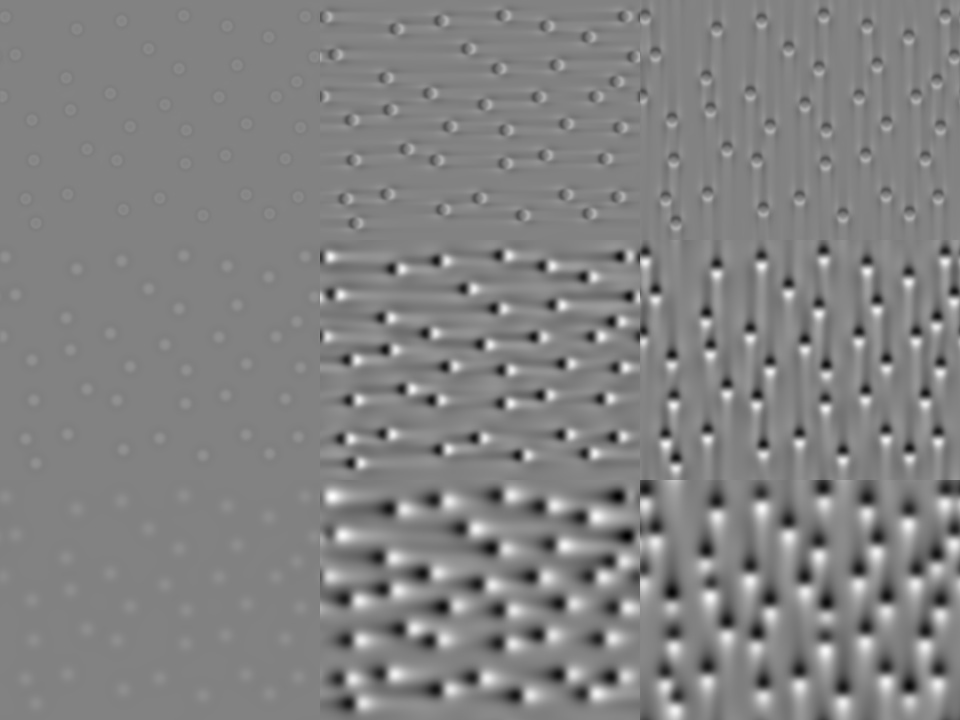

In [25]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_cobertura_espectral())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_forma_espacial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_resultado_convoluciones3D())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

#### Apartado e.c)

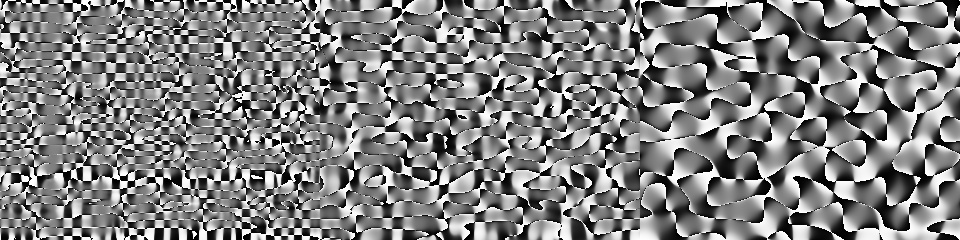

In [26]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_energia_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_energia_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_fase_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_fase_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_orientacion_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_orientacion_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

#### Apartado e.d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

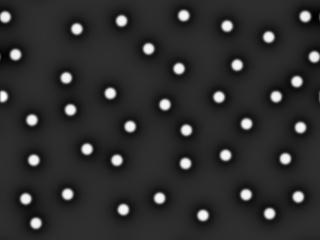

In [27]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCD_circulos_1sentido_contrario.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_imagen_reconstruida())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

## Resultados para 'SCE_bur_11_girando.avi':

#### Apartado e.b)

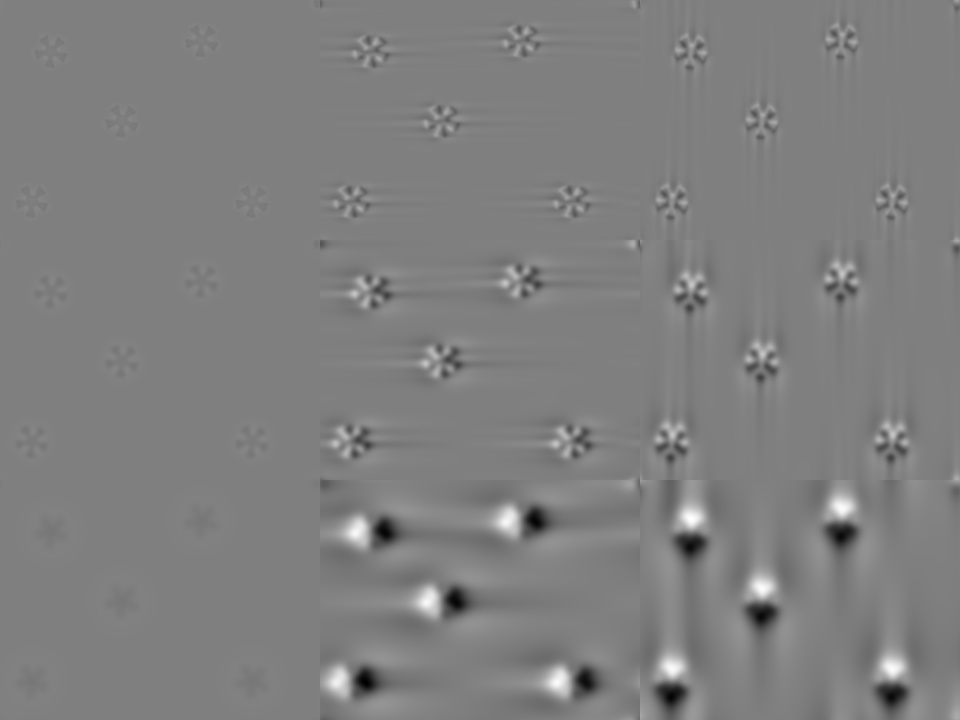

In [28]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_cobertura_espectral())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_forma_espacial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_resultado_convoluciones3D())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

#### Apartado e.c)

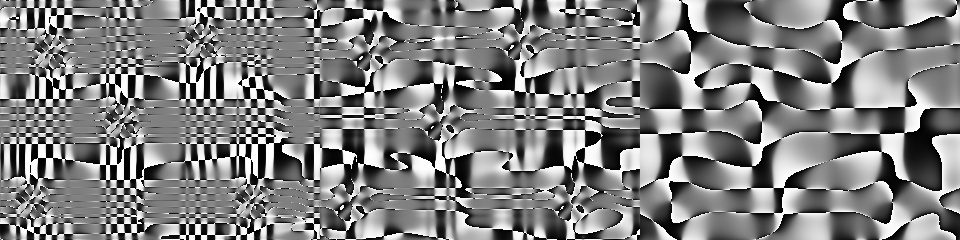

In [29]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_energia_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_energia_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_fase_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_fase_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_orientacion_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_orientacion_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

#### Apartado e.d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

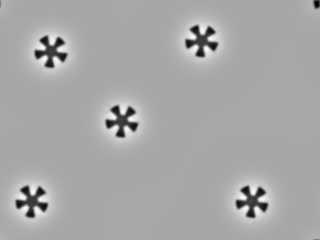

In [30]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCE_bur_11_girando.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_imagen_reconstruida())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

## Resultados para 'SCE_circulos_girando_3.avi':

#### Apartado e.b)

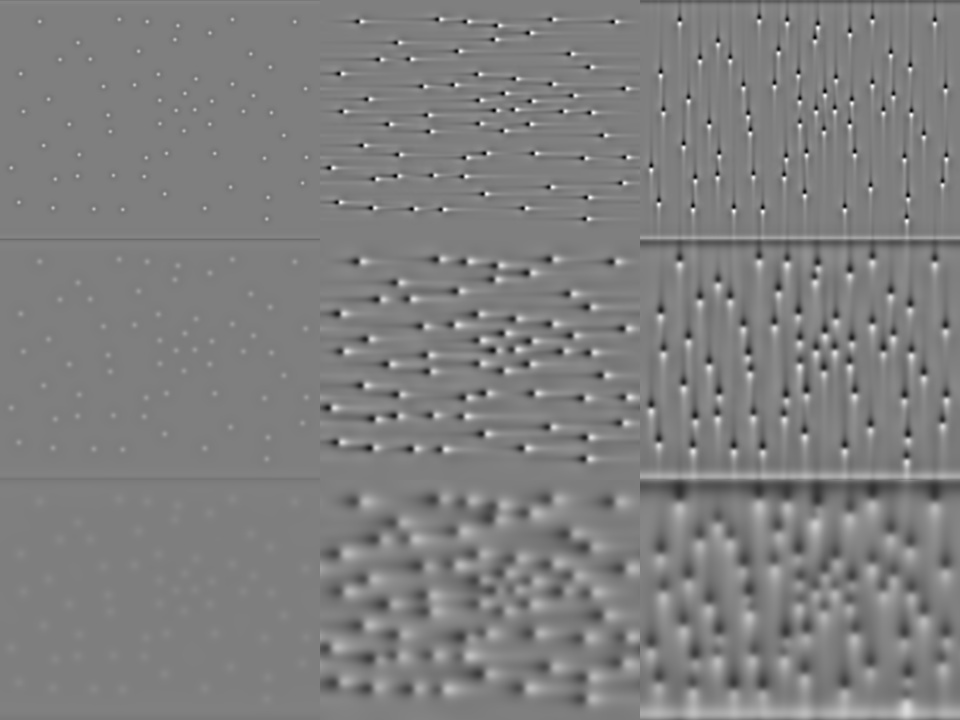

In [31]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_cobertura_espectral())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_forma_espacial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_resultado_convoluciones3D())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

#### Apartado e.c)

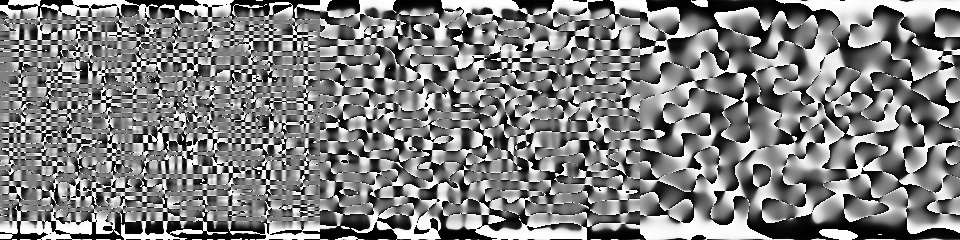

In [32]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_energia_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_energia_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_fase_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_fase_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_orientacion_local_total())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_orientacion_local_parcial())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)

#### Apartado e.d)
Para la reconstrucción le da imagen se utilizan las respuestas pares de los filtros ya que si utilizamos la parte impar estaríamos reconstruyendo la transformada de Hilbert.

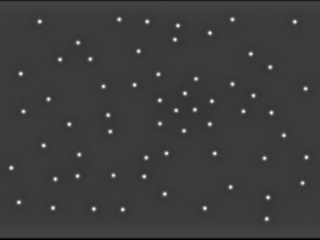

In [34]:
# Leemos el video
video = cv2.VideoCapture('../datatest/videos/SCE_circulos_girando_3.avi')

if not video.isOpened():
    print("Error al abrir el video.")
    exit()

display_handle=display(None, display_id=True)
ret, img = video.read()
while(True):
    ret, img = video.read()
    if(not ret):
        cv2.destroyAllWindows()
        break

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    banco_filtrosMONO3D = BkofMono3D(gray_img, nscale=3, minWaveLength=8, mult=2.1, sigmaOnf=0.55)
    ret, img = cv2.imencode('.jpg', banco_filtrosMONO3D.plot_imagen_reconstruida())
    display_handle.update(Image(data=img.tobytes()))

    cv2.waitKey(10)

video.release()
display_handle.update(None)